# **Name:** \_\_\_\_\_Huanchen Wang, Peiying Zhang\_\_\_\_\_

**EIDs:** \_\_\_\_\_huancwang2, peiyzhang9\_\_\_\_\_

**Kaggle Competition:** \_\_\_\_BirdCLEF 2023 \_\_\_\_\_

**Kaggle Team Name:** \_\_\_\_\_Unknown Wang \_\_\_\_\_


# CS5489 - Course Project (2023B)


## Possible Projects

For the course project, you may select **one** of the following competitions on Kaggle **or** define your own course project:

### [BirdCLEF 2023](https://www.kaggle.com/competitions/birdclef-2023): Identify bird calls in soundscapes

>Birds are excellent indicators of biodiversity change since they are highly mobile and have diverse habitat requirements. Changes in species assemblage and the number of birds can thus indicate the success or failure of a restoration project. However, frequently conducting traditional observer-based bird biodiversity surveys over large areas is expensive and logistically challenging. In comparison, passive acoustic monitoring (PAM) combined with new analytical tools based on machine learning allows conservationists to sample much greater spatial scales with higher temporal resolution and explore the relationship between restoration interventions and biodiversity in depth.
>
> For this competition, you'll use your machine-learning skills to identify Eastern African bird species by sound. Specifically, you'll develop computational solutions to process continuous audio data and recognize the species by their calls. The best entries will be able to train reliable classifiers with limited training data. If successful, you'll help advance ongoing efforts to protect avian biodiversity in Africa, including those led by the Kenyan conservation organization NATURAL STATE.


# OUTLINE:
+ Data Analysis and Preprocessing
+ Using the MFCCs as features for model training
+ Using the Mel-spectrogram as features for model training
+ Conclusion
+ Advanced Exploration

# Some Settings and Imports

In [1]:
%matplotlib inline
import matplotlib_inline   # setup output image format
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import matplotlib.pyplot as plt
import matplotlib
from PIL import Image
import numpy as np
from sklearn import *
from scipy import stats
np.random.seed(100)
import csv
from scipy import io
import pickle
from IPython.display import Audio, display, Image
import os.path

In [2]:
import librosa
import pandas as pd
import folium
import folium.plugins as plugins
import json
from coord_convert.transform import wgs2gcj, wgs2bd, gcj2wgs, gcj2bd, bd2wgs, bd2gcj 
import seaborn as sns
from tqdm.notebook import tqdm
import gc
import lightgbm as lgb
import joblib
import os
import warnings
warnings.filterwarnings('ignore')
import logging

In [3]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
from torch.utils.tensorboard import SummaryWriter
import pytorch_lightning as pl
import torchaudio
import torchvision
import torch
print('PyTorch version:{}, Device:{}'.format(torch.__version__, torch.device('cuda' if torch.cuda.is_available() else 'cpu')))

PyTorch version:2.0.0+cu117, Device:cuda


In [4]:
seed_value = 46

np.random.seed(seed_value)

torch.manual_seed(seed_value)
torch.cuda.manual_seed_all(seed_value)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [5]:
class Config:
    seed = 46
    n_fft = 2048
    duration = 5
    sr = 32000
    hop_length = 512
    fmin = 20
    fmax = 12000
    n_mels = 128
    n_mfcc = 20

    n_fold = 5
    n_class = 264
    train_df_path = './train_df.csv'
    test_df_path = './test_df.csv'
    mel_dir = './train_mel/'
    
    batch_size = 32
    num_workers = 2
    device = torch.device('cuda')
    epochs = 12
    PRECISION = 16    
    PATIENCE = 8    
    pretrained = True            
    weight_decay = 1e-3
    lr = 1e-3
    mix_up_alpha = 0.2

In [5]:
def showAudio(wav, info, sample_rate=32000):
    wavform = wav.numpy()
    display(Audio(wavform, rate=sample_rate))
    Title = 'Label {}| Name {}| Rating {}'.format(info['primary_label'], info['scientific_name'], str(info['rating']))
    plt.figure(figsize=(10,4))
    fig, ax = plt.subplots(nrows=2, sharex=True, tight_layout=True)
    fig.suptitle(Title)
    librosa.display.waveshow(wavform, sr=sample_rate, ax=ax[0])
    ax[0].set(title='Waveform')   
    S = torchaudio.transforms.MelSpectrogram(sample_rate, n_fft=1024, hop_length=None, n_mels=128)(wav)
    S_dB = torchaudio.transforms.AmplitudeToDB(top_db=80)(S)
    librosa.display.specshow(S_dB[0,:,:].numpy(), sr=sample_rate, x_axis='time', y_axis='mel', ax=ax[1])
    ax[1].set(title='Mel-frequency spectrogram')
    plt.show(block=False)

def load_pickle(fname):
    f = open(fname, 'rb')
    out = pickle.load(f)
    f.close()
    return out

def save_pickle(data, filename):
    with open(filename, 'wb') as f:
        pickle.dump(data, f)

In [6]:
def padded_cmap_metrics(solution, submission, padding_factor=5):
    # solution = solution.drop(['row_id'], axis=1, errors='ignore')
    # submission = submission.drop(['row_id'], axis=1, errors='ignore')
    new_rows = []
    for i in range(padding_factor):
        new_rows.append([1 for i in range(len(solution.columns))])
    new_rows = pd.DataFrame(new_rows)
    new_rows.columns = solution.columns
    padded_solution = pd.concat([solution, new_rows]).reset_index(drop=True).copy()
    padded_submission = pd.concat([submission, new_rows]).reset_index(drop=True).copy()
    score = metrics.average_precision_score(
        padded_solution.values,
        padded_submission.values,
        average='macro',
    )
    return score

def LR_AP(solution, submission):
    score = metrics.label_ranking_average_precision_score(solution, submission)
    return score

def AUC(solution, submission):
    score = metrics.roc_auc_score(solution, submission)
    return score

# Part1. Data Analysis and Preprocessing

### Before construct the dataset and model for training, we need to do some data analysis and preprocessing. 
+ Load the training audio data and metadata
  + using the pandas to load the metadata
  + using librosa to load the audio data
  
+ Analyze the data:
  + visaulize and analyze the number of each bird species audio data
  + display a sreies related features of the audio data
  + analyze some features in metadata, which may realted the audio and bird species
  
+ Preprocess the audio data:
  + check basic information of each audio, like duration, sample rate, etc.
  + upsample the dataset to make some species have more data
  + aplly the dimension reduction for preprocessing the audio data
  + apply the concept of the bag of words to preprocess the delta-mfccs data to align them.

## Load the traingin metadata

In [14]:
df_meta = pd.read_csv('./df_meta.csv')
df_meta.head(3)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,sample_rate,num_channels,num_frames,duration
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg,32000.0,1.0,1459513.0,45.609781
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg,32000.0,1.0,597682.0,18.677563
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg,32000.0,1.0,1240503.0,38.765719


## Load the training audio data
+ Load the .ogg file and save audio's wavform and sample rate
+ Using the wavform and sample to get the mel-sepctrogram for each audio
+ Do the preprocessing for them to get the features for model training

## Dispaly a series features about the audio:
+ play the audio
+ the waveform
+ the mel-spectrogram

<Figure size 1000x400 with 0 Axes>

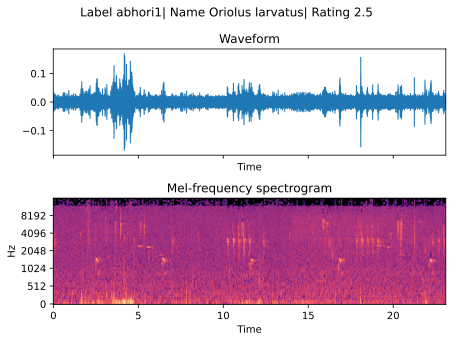

In [104]:
ii = 20
w, s = torchaudio.load('./train_audio/{}'.format(df_meta.loc[ii,'filename']))
showAudio(w,df_meta.iloc[ii,:], s)

<Figure size 1000x400 with 0 Axes>

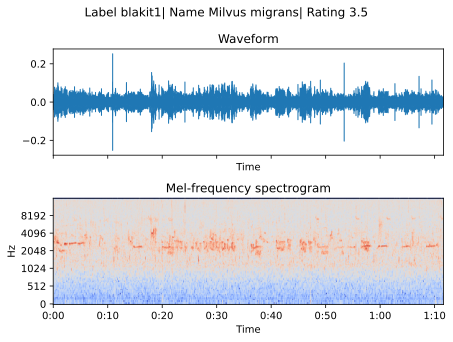

In [103]:
ii = 2000
w, s = torchaudio.load('./train_audio/{}'.format(df_meta.loc[ii,'filename']))
showAudio(w,df_meta.iloc[ii,:], s)

## Analyze the meta data
+ Visualize the the number of audio for each bird species in primary label;
+ Visualize the location distribution of each bird species;
  + visualize the distribution of the latitude and longitude of each bird species;
  + visualize the latitude and longitude of each bird species in boxplot;
  + visualize the std.var of the latitude and longitude of each bird species;
+ Visualize the rate of the each bird species in the dataset;

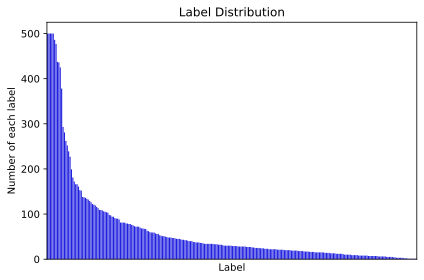

In [9]:
plt.figure(figsize=(6, 4))
sns.countplot(x='primary_label', data=df_meta, order=df_meta['primary_label'].value_counts().index, color='blue')
plt.title('Label Distribution')
plt.xlabel('Label')
plt.ylabel('Number of each label')
plt.xticks([])
plt.tight_layout()
plt.show()

## Unbalanced Dataset
+ We found that the number of audio for each bird species (primary label) is not balanced, which means the training dataset is unbalanced. 
  
+ The number of audio for each bird species is from 1 to 500. 
### Thus, for the subsequent training, we need to do the weighted training to deal with the unbalanced dataset.

In [8]:
# Check the proportion of the data with secondary labels

prop = len(df_meta.loc[df_meta['secondary_labels']!='[]'] )/len(df_meta)
print('The proportion of the data with secondary labels is {:.2f}%'.format(prop*100))

The proportion of the data with secondary labels is 13.61%


## Multilabel task
+ We found that there a few audio (13.61%/100%) have multi-birds call in the same audio.
+ We will process the secondary label in below. (add the secondary label to the primary label)
  
### Thus, this is a multilabel task.

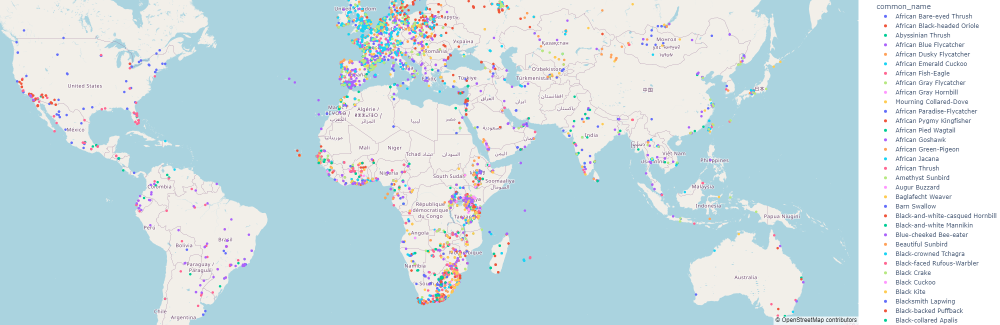

In [18]:
# Cheack the location distribution of each bird species

import plotly.express as px
fig = px.scatter_mapbox(
    df_meta, 
    lat="latitude", lon="longitude", color="common_name",
    hover_name="filename", hover_data=["common_name", "author", "rating"],
    zoom=2, height=500, 
    center=dict(
        lat=df_meta['latitude'].mean(), 
        lon=df_meta['longitude'].mean()
    )
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

img_bytes = fig.to_image(format="png", width=2000, height=650)

Image(img_bytes)

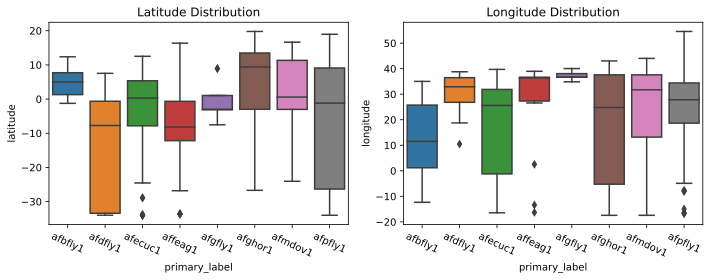

In [51]:
sample_name_list = df_meta['primary_label'].unique()[3:11]

plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)
df_4vis = df_meta.loc[df_meta['primary_label'].isin(sample_name_list)]
sns.boxplot(x='primary_label', y='latitude', data=df_4vis)
plt.xticks(rotation=-25)
plt.title('Latitude Distribution')

plt.subplot(1,2,2)
sns.boxplot(x='primary_label', y='longitude', data=df_4vis)
plt.xticks(rotation=-25)
plt.title('Longitude Distribution')
plt.tight_layout()
plt.show()

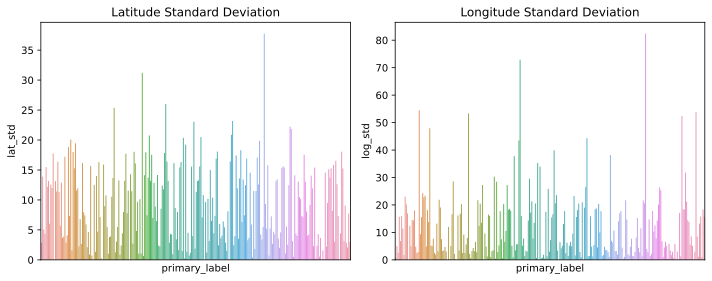

In [39]:
plt.figure(figsize=(10, 4))
df_location4std = df_meta.groupby('primary_label').agg({'latitude': 'std','longitude': 'std'}).rename(columns={'latitude': 'lat_std','longitude':'log_std'}).reset_index()
plt.subplot(1,2,1)
plt.title('Latitude Standard Deviation')
sns.barplot(x='primary_label', y='lat_std', data=df_location4std)
plt.xticks([])
plt.subplot(1,2,2)
plt.title('Longitude Standard Deviation')
sns.barplot(x='primary_label', y='log_std', data=df_location4std)
plt.xticks([])
plt.tight_layout()

## Location information in the metadata
+ According to the overview of each bird species distribution in the map, we found that some bird species have a large inhabiting area.
+ According to the boxing chart and the bar chart of each bird species latitude and longitude standard deviation, 

    we found that the audio of this bird species may have a large difference in location.

### Thus, the location information as a feature may be useful for the model training.

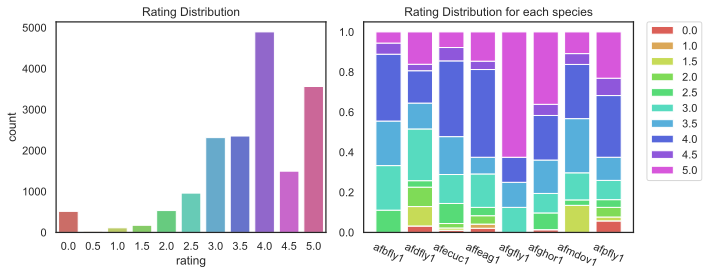

In [112]:
plt.figure(figsize=(10, 4))

cmap = sns.color_palette("hls", 11)
plt.subplot(1,2,1)
df_rating = df_meta['rating'].value_counts().reset_index()
df_rating.columns = ['rating', 'count']
sns.barplot(x='rating', y='count', data=df_rating, palette=cmap)
plt.title('Rating Distribution')
plt.subplot(1,2,2)

df_4stack_rating = df_4vis.groupby(['primary_label', 'rating']).agg({'rating': 'count'}).rename(columns={'rating': 'count'}).reset_index()
df_4stack_rating.columns = ['primary_label', 'rating', 'count']
df_4stack_rating       
df_4stack_rating['count'] = df_4stack_rating['count']/df_4stack_rating.groupby(['primary_label'])['count'].transform('sum')
for rate in df_4stack_rating['rating'].unique():
    for label in df_4stack_rating['primary_label'].unique():
        if len(df_4stack_rating.loc[(df_4stack_rating['primary_label']==label)&(df_4stack_rating['rating']==rate)])==0:
            df_4stack_rating = pd.concat([df_4stack_rating, pd.DataFrame({'primary_label': [label], 'rating': [rate], 'count': [0]})], axis=0)

df_4stack_rating = df_4stack_rating.sort_values(['primary_label', 'rating']).reset_index(drop=True)
bottom = np.zeros(len(df_4stack_rating['primary_label'].unique()))
index = 0
for rate in df_4stack_rating['rating'].unique():
    x = df_4stack_rating['primary_label'].unique()
    y1 = df_4stack_rating.loc[df_4stack_rating['rating']==rate, 'count'].values
    plt.bar(x, y1, bottom=bottom, label=rate, color=cmap[index])
    index += 1
    bottom += y1
plt.title('Rating Distribution for each species')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.xticks(rotation=-25)
plt.tight_layout()


## Rating information in the metadata
+ First bar chart displayed that different rating in total dataset, and we found that there are large variance in the rating.
+ Second bar chart displayed that different rating in each bird species (sampled some species), we also found that there are different propotion of the rating for each bird species.
  
### Thus, the rating information as a feature may be useful for the model training.

## Preprocess the audio data
To get the feature for the model training, we need to do some preprocessing for the audio data:
1. Ensure the same sample rate for all the audio data (Since the default sample rate is 32000, we need to check)
2. Ensure whether the audio data is mono or not (Since the default channel is 1, we need to check)
3. Since each audio is not the same length, and their length may too long for following training, we decide to random select 5 seconds from each audio and use them as the training data.

According to the previous rational performance in Assignment 2, the mainly feature was used is the mfccs,

**which cost less time and get a related good performance.**

+ MFCCs (Mel-frequency cepstrum coefficients) are  *dimensionality-reduced* version of the Mel-frequency spectrogram. Specifically, the log is applied to the magnitudes, and then a Discrete Cosine Transform is applied at each time. 
+ To get the MFCC, the Discrete Cosine Transform (DCT) is applied to each 128-dim log-Mel bin vector.  Here we use 20-dimension DCT, so the 128-dim vector is convereted to 20-dim in each time step.  The left plot shows the MFCCs as an image, while the right plots the individual dimensions over time.

### Thus, using mfccs as features with different Machine Learning models to get the baseline for further exploring on the feature engineering and model selection. 

## Get the basic information of each audio
+ The duration of each audio
+ The sample rate of each audio
+ The frame of each audio
+ The channel of each audio

In [12]:
def get_audio_info(df:pd.DataFrame):
    for i, filename in enumerate(tqdm(df['filename'])):
        myfile = './train_audio/'+filename
        w, sr = torchaudio.load(myfile)
        sample_rate = sr
        num_channels, num_frames = w.shape
        duration = num_frames/sample_rate
        df.loc[i, 'sample_rate'] = sample_rate
        df.loc[i, 'num_channels'] = num_channels
        df.loc[i, 'num_frames'] = num_frames
        df.loc[i, 'duration'] = duration

In [14]:
get_audio_info(df_meta)
df_meta.to_csv('df_meta.csv', index=False)
df_meta.head(3)

  0%|          | 0/16941 [00:00<?, ?it/s]

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,sample_rate,num_channels,num_frames,duration
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg,32000.0,1.0,1459513.0,45.609781
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg,32000.0,1.0,597682.0,18.677563
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg,32000.0,1.0,1240503.0,38.765719


In [14]:
print(df_meta['sample_rate'].value_counts())
print(df_meta['num_channels'].value_counts())

# give statistics of the audio duration and number of frames
df_meta[['duration', 'num_frames']].describe()

32000.0    16941
Name: sample_rate, dtype: int64
1.0    16941
Name: num_channels, dtype: int64


,duration,num_frames
count,16941.000000,1.694100e+04
mean,40.885565,1.308338e+06
std,69.610286,2.227529e+06
min,0.548000,1.753600e+04
25%,12.773875,4.087640e+05
50%,24.624000,7.879680e+05
75%,45.871031,1.467873e+06
max,2373.528000,7.595290e+07


## After analysis the basic information of each audio, we found that:
+ After check the audio basic information, the sample rate and channel are all the same, which is 32000 and 1.
+ Based on the stastical information of the audio duration, we found there are some audio which is too long, which may cause sample dimension too large. Thus, we decide to random select fix length from each audio and use them as the training data when using the mel-spectrogram. OR using the mfccs as features which do the **dimension reducing** from the mel-spectrogram.

<Figure size 1000x300 with 0 Axes>

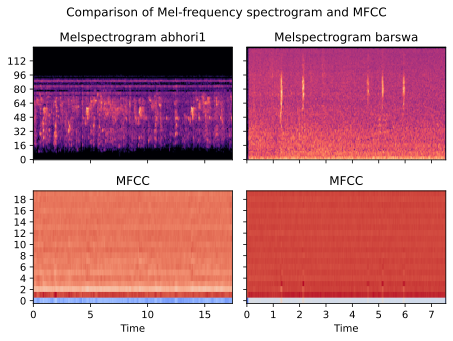

In [16]:
import numpy as np
ii = 90
w, s = librosa.load('./train_audio/{}'.format(df_meta.loc[ii,'filename']), sr=32000)
S = librosa.feature.melspectrogram(y=w, sr=s, n_mels=128,n_fft=1024, hop_length=512)
S_dB = librosa.power_to_db(S, ref=np.max)
plt.figure(figsize=(10,3))
fig, ax = plt.subplots(nrows=2,ncols=2)
librosa.display.specshow(S_dB, sr=s,x_axis='time',ax=ax[0][0])
ax[0][0].set(title='Melspectrogram {}'.format(df_meta.loc[ii,'primary_label']))
ax[0][0].label_outer()
ax[0][0].set_yticks(np.arange(0, 128, 16), minor=False)
mfccs = librosa.feature.mfcc(S=librosa.power_to_db(S), n_mfcc=20)
librosa.display.specshow(mfccs, sr=s,x_axis='time' ,ax=ax[1][0])
ax[1][0].set_yticks(np.arange(0, 20, 2), minor=False)
ax[1][0].set(title='MFCC')
ax[1][0].label_outer()
plt.suptitle('Comparison of Mel-frequency spectrogram and MFCC')

ii0 = 1000
w, s = librosa.load('./train_audio/{}'.format(df_meta.loc[ii0,'filename']), sr=32000)
S = librosa.feature.melspectrogram(y=w, sr=s, n_mels=128,n_fft=1024, hop_length=512)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, sr=s,x_axis='time', ax=ax[0][1])
ax[0][1].set(title='Melspectrogram {}'.format(df_meta.loc[ii0,'primary_label']))
ax[0][1].label_outer()
ax[0][1].set_yticks(np.arange(0, 128, 16), minor=False)
mfccs = librosa.feature.mfcc(S=librosa.power_to_db(S), n_mfcc=20)
librosa.display.specshow(mfccs, sr=s,x_axis='time' ,ax=ax[1][1])
ax[1][1].set_yticks(np.arange(0, 20, 2), minor=False)
ax[1][1].set(title='MFCC')
ax[1][1].label_outer()
plt.tight_layout()
plt.show()

## According to compare the different bird species audio on their Mel-spectrogram and MFCCS.
+ Each Mel-spectrogram to each bird species is much more different, which means the Mel-spectrogram is a good feature can represent the different bird species' audio.
+ Mfccs can also be used to represent the audio data, which is the dimension reduced version of the Mel-spectrogram to classify different bird species.

### Thus, for a light classification task, we can use the mfccs as features to train the model, and for a more complex and large classification task, we can use the mel-spectrogram as features to train the model.

In [55]:
df_meta = pd.read_csv('./df_meta.csv')
df_meta.head(3)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,sample_rate,num_channels,num_frames,duration
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg,32000.0,1.0,1459513.0,45.609781
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg,32000.0,1.0,597682.0,18.677563
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg,32000.0,1.0,1240503.0,38.765719


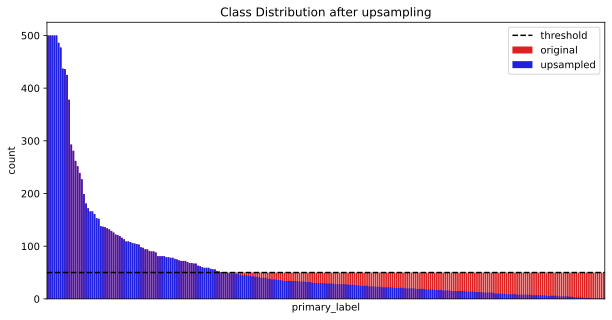

In [15]:
thr = 50
class_dist = df_meta['primary_label'].value_counts()

down_classes = class_dist[class_dist < thr].index.tolist()

up_list = []
for label in down_classes:
        class_df = df_meta[df_meta['primary_label'] == label]
        num_up = thr - class_df.shape[0]
        class_df = class_df.sample(n=num_up, replace=True, random_state=46)
        up_list.append(class_df)

upsample_df = pd.concat([df_meta] + up_list, axis=0, ignore_index=True)
upsample_df['primary_label_id'] = upsample_df['primary_label'].factorize()[0]
upsample_df['unique_id'] = upsample_df.index.tolist()

plt.figure(figsize=(10, 5))
sns.countplot(x='primary_label', data=upsample_df, order=upsample_df['primary_label'].value_counts().index, color='red', label='original')
sns.countplot(x='primary_label', data=df_meta, order=df_meta['primary_label'].value_counts().index, color='blue', label='upsampled')
plt.axhline(y=50, color='k', linestyle='--', label='threshold')
plt.xticks([])
plt.title('Class Distribution after upsampling')
plt.legend()
plt.show()

## Upsample the unbalanced dataset
+ In above, we found that the number of audio for each bird species is not balanced, which means the training dataset is unbalanced.
+ Since some species sample number is too small nearly 1, we need to upsample the dataset to make the dataset balanced.
  
  Otherwise, maybe some species will be absent in the train/ validation dataset.

### After upsample the dataset, we can find in the above chart that these too small species have more data now.

## Split the Dataset:
### Split the dataset into train, validation and test dataset is a common practice in the machine learning task.
+ Split the upsampled dataset into train and test dataset
+ 5-fold split the train dataset into train and validation dataset for cross validation

In [16]:
train_df, test_df = model_selection.train_test_split(upsample_df, test_size=0.2, random_state=46, stratify=upsample_df['primary_label'])
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

In [17]:
skf = model_selection.StratifiedKFold(n_splits=5, shuffle=True, random_state=46)

for fold, (train_idx, val_idx) in enumerate(skf.split(train_df, train_df['primary_label'])):
    train_df.loc[val_idx, 'fold'] = fold

train_df['fold'] = train_df['fold'].astype(int)

## Process the secondary label and set the multi-label one hot encoding
+ As the above analysis, we found that there are 13.61% audio have multi-birds call in the same audio.
+ To get more accurate and rational prediction, we need to process the secondary label and set the multi-label one hot encoding.

In [18]:
#primary label add second label into multilabel
train_df['secondary_labels'] = train_df['secondary_labels'].apply(lambda x: x[1:-1].split(','))
# remove the token in each item
train_df['secondary_labels'] = train_df['secondary_labels'].apply(lambda x: [i[1:-1] for i in x])
train_df['secondary_labels'] = train_df['secondary_labels'].apply(lambda x: [i.replace('\'','') for i in x])
train_df['secondary_labels'] = train_df['secondary_labels'].apply(lambda x: [i for i in x if i != ''] )
train_df_multi_labels = train_df.apply(lambda x: [x['primary_label']] + x['secondary_labels'], axis=1)

train_onehot_list = []
label_list = df_meta['primary_label'].unique().tolist()
for i in tqdm(range(len(train_df))):
    one_hot = [0]*len(label_list)
    for j in train_df_multi_labels[i]:
        one_hot[label_list.index(j)] = 1
    train_onehot_list.append(one_hot)

test_df['secondary_labels'] = test_df['secondary_labels'].apply(lambda x: x[1:-1].split(','))
# remove the token in each item
test_df['secondary_labels'] = test_df['secondary_labels'].apply(lambda x: [i[1:-1] for i in x])
test_df['secondary_labels'] = test_df['secondary_labels'].apply(lambda x: [i.replace('\'','') for i in x])
test_df['secondary_labels'] = test_df['secondary_labels'].apply(lambda x: [i for i in x if i != ''] )
test_df_multi_labels = test_df.apply(lambda x: [x['primary_label']] + x['secondary_labels'], axis=1)
test_onehot_list = []
for i in tqdm(range(len(test_df))):
    one_hot = [0]*len(label_list)
    for j in test_df_multi_labels[i]:
        one_hot[label_list.index(j)] = 1
    test_onehot_list.append(one_hot)

  0%|          | 0/17766 [00:00<?, ?it/s]

  0%|          | 0/4442 [00:00<?, ?it/s]

In [19]:
train_onehot_df = pd.DataFrame(train_onehot_list, columns=label_list)
train_df = pd.concat([train_df, train_onehot_df], axis=1)
train_df.head(3)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,...,yebsto1,yeccan1,yefcan,yelbis1,yenspu1,yertin1,yesbar1,yespet1,yetgre1,yewgre1
0,colsun2,[],"['alarm call', 'male']",-33.4733,26.9505,Hedydipna collaris,Collared Sunbird,Tim Cockcroft,Creative Commons Attribution-NonCommercial-Sha...,4.5,...,0,0,0,0,0,0,0,0,0,0
1,eubeat1,[],['call'],-26.4210,26.3612,Merops apiaster,European Bee-eater,Tony Archer,Creative Commons Attribution-NonCommercial-Sha...,4.0,...,0,0,0,0,0,0,0,0,0,0
2,eubeat1,[],[''],17.9021,42.3810,Merops apiaster,European Bee-eater,David Darrell-Lambert,Creative Commons Attribution-NonCommercial-Sha...,5.0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
test_onehot_df = pd.DataFrame(test_onehot_list, columns=label_list)
test_df = pd.concat([test_df, test_onehot_df], axis=1)
test_df.head(3)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,...,yebsto1,yeccan1,yefcan,yelbis1,yenspu1,yertin1,yesbar1,yespet1,yetgre1,yewgre1
0,yespet1,[],"['adult', 'alarm call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow,isaac kilusu,Creative Commons Attribution-NonCommercial-Sha...,5.0,...,0,0,0,0,0,0,0,1,0,0
1,hamerk1,[],[''],18.2116,42.4867,Scopus umbretta,Hamerkop,David Darrell-Lambert,Creative Commons Attribution-NonCommercial-Sha...,4.0,...,0,0,0,0,0,0,0,0,0,0
2,witswa1,[],['call'],19.3642,98.9563,Hirundo smithii,Wire-tailed Swallow,Ross Gallardy,Creative Commons Attribution-NonCommercial-Sha...,4.0,...,0,0,0,0,0,0,0,0,0,0


# Part 2: Using the MFCCs as features for model training
+ Processing and training with mfccs as features is light but fast.
+ Using the mfccs as features with different Machine Learning models to get the baseline for further exploring on the feature engineering and model selection.

In [26]:
upsample_df.to_csv('upsample_df.csv', index=False)
train_df.to_csv('train_df.csv', index=False)
test_df.to_csv('test_df.csv', index=False)

In [ ]:
def get_mfccs(df:pd.DataFrame):
    datasets = []
    label_list = []
    for i, filename in enumerate(tqdm(df['filename'])):
        myfile = './train_audio/'+filename
        w, sr = librosa.load(myfile, sr=32000)
        S = librosa.feature.melspectrogram(y=w, sr=sr, n_mels=128, n_fft=2048, fmin=20, fmax=12000, hop_length=512)
        mfccs = librosa.feature.mfcc(S=librosa.power_to_db(S, ref=np.max), n_mfcc=20)
        datasets.append(mfccs)
        label_list.append(df.loc[i, 'primary_label'])
    return datasets, label_list


mfccs_dataset, label_dataset = get_mfccs(upsample_df)

In [10]:
mfccs_dataset = load_pickle('mfccs_dataset.pkl')

In [13]:
# up_mfccs_dataset = mfccs_dataset

# for i in range(len(up_df)):
#     if i >= len(mfccs_dataset):
#         up_mfccs_dataset.append(mfccs_dataset[up_df.loc[i, 'unique_id']])

In [6]:
up_mfccs_dataset = load_pickle('up_mfccs_dataset.pkl')
up_df = pd.read_csv('up_df.csv')

## MFCCs feature representation
Similar to the Assignment 2

One trick to include time-series information into a vector representation is to append the difference between two consecutive feature vectors.  This way, we can include some relationship between two time steps in the representation.

In [15]:
# compute delta MFCCs
def compute_delta_mfccs(mfccs):
    dmfccs = []
    for m in mfccs:
        m = m.T
        tmp = m[1:] - m[0:-1]
        dm = np.hstack((m[0:-1], tmp))
        dmfccs.append(dm)
    return dmfccs

In [16]:
label_dataset = up_df['primary_label_id'].tolist()
train_mfccs, eval_mfccs, train_labels, eval_labels =  model_selection.train_test_split(up_mfccs_dataset, label_dataset, test_size=0.2, random_state=46)

In [17]:
train_dmfccs = compute_delta_mfccs(train_mfccs)
eval_dmfccs  = compute_delta_mfccs(eval_mfccs)

del up_mfccs_dataset, train_mfccs, eval_mfccs
gc.collect()

57568

In [18]:
save_pickle(train_dmfccs, 'train_dmfccs.pkl')
save_pickle(eval_dmfccs, 'eval_dmfccs.pkl')
save_pickle(train_labels, 'train_labels.pkl')
save_pickle(eval_labels, 'eval_labels.pkl')

In [6]:
train_dmfccs = load_pickle('train_dmfccs.pkl')
eval_dmfccs = load_pickle('eval_dmfccs.pkl')
train_labels = load_pickle('train_labels.pkl')
eval_labels =  load_pickle('eval_labels.pkl')

## bag-of-(audio)words

+ To align the each different lenth sample for subsequent machine learning algorithms, we need to encode the MFCCs into a vector.

+ One solution is to use a "bag-of-audio-words" representation, which is analogous to the bag-of-words representation for text.
Here, we build a vocabulary of "audio-words" and map each MFCC to one of the words.  Then we can represent each sound as a histogram of counts.

### We will use the **k-means clustering** algorithm to build the codebook of audio words.

In [8]:
# put dmfccs from all training data together
all_dmfccs = np.vstack(train_dmfccs)
print(all_dmfccs.shape)

(42564268, 40)


In [9]:
# run k-means to build codebook
km = cluster.KMeans(n_clusters=60, random_state=46)
km.fit(all_dmfccs[0::60])  # subsample by 10 to make it faster
km.cluster_centers_

d:\Anaconda\envs\birdclef\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([[-3.9163593e+02, -7.0768471e+00, -3.3935749e+01, ...,
        -3.2790367e-02, -5.8959112e-02, -2.0976929e-02],
       [-7.3056592e+02,  3.9481251e+01, -5.4231331e+01, ...,
        -2.1755021e-02, -7.8533478e-02,  2.6424548e-02],
       [-5.2978687e+02,  1.0910846e+02,  4.7706375e+00, ...,
        -4.2872094e-03, -7.4593492e-02, -3.4714756e-03],
       ...,
       [-7.3096521e+02,  9.9925720e+01, -1.2617798e+00, ...,
         3.8041063e-02,  6.5479741e-02,  8.0062663e-03],
       [-4.5324490e+02,  1.2587499e+02, -1.5423468e+01, ...,
        -1.3353340e-02,  7.7953205e-02,  4.8912000e-02],
       [-7.2056482e+02,  3.6181026e+01, -7.5436821e+00, ...,
        -4.8366051e-02, -1.3707975e-02,  1.1922739e-02]], dtype=float32)

In [10]:
def bow_transform(model, mfccs):
    numwords = model.cluster_centers_.shape[0]
    bows = np.zeros((len(mfccs), numwords))
    for i in range(len(mfccs)):
        w = model.predict(mfccs[i])
        bw = np.bincount(w, minlength=numwords)
        bows[i,:] = bw
    return bows

In [11]:
train_bow = bow_transform(km, train_dmfccs)
eval_bow  = bow_transform(km, eval_dmfccs)
del train_dmfccs, eval_dmfccs
gc.collect()

In [13]:
save_pickle(train_bow, 'train_bow.pkl')
save_pickle(eval_bow, 'eval_bow.pkl')

In [30]:
import warnings
warnings.filterwarnings('ignore')

In [38]:
def fine_tunePCA(train_bow, train_labels, eval_bow, eval_labels):
    paragrid = {'C': [0.1, 1, 10, 100, 1000]}
    n_components = [5, 10, 20, 25, 30, 40, 50, 55, 60]
    padded_cmap_scores = []
    acc_list = []
    best_score = 0
    best_n = 0
    bset_model = None
    for n in tqdm(n_components):
        PCA = decomposition.PCA(n_components=n, random_state=46)
        train_bowPCA = PCA.fit_transform(train_bow)
        eval_bowPCA = PCA.transform(eval_bow)
        lrcv = model_selection.GridSearchCV(linear_model.LogisticRegression(random_state=46, class_weight='balanced'), paragrid, cv=3, n_jobs=8)
        lrcv.fit(train_bowPCA, train_labels)
        eval_dummy_label = pd.get_dummies(eval_labels)
        eval_pred_prob = lrcv.predict_proba(eval_bowPCA)
        eval_pred_prob = pd.DataFrame(eval_pred_prob, columns=eval_dummy_label.columns)
        score = padded_cmap_metrics(eval_dummy_label, eval_pred_prob)
        padded_cmap_scores.append(score)
        acc = lrcv.score(eval_bowPCA, eval_labels)
        acc_list.append(acc)
        if score > best_score:
            best_score = score
            best_n = n
            best_model = lrcv
    return best_model, best_n, padded_cmap_scores, acc_list

## Number of Cluster for K-means is not enough
### Using Logistic Regression select a appropirate component for model training
+ Based on the PCA components plot of Logistic Regression, we found that the model score is increasing when the number of components is increasing,

  which means the number of cluster is not enough for the mfccs feature representation. 
  
+ If increase the number of cluster, the model score may be increased.

In [ ]:
best_lrcv, best_n, padded_cmap_scores, acc_list = fine_tunePCA(train_bow, train_labels, eval_bow, eval_labels)

<Figure size 1000x400 with 0 Axes>

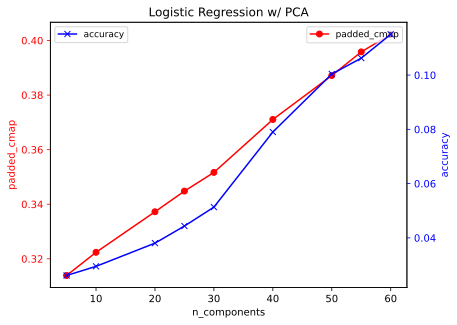

In [87]:


plt.figure(figsize=(10, 4))
fig, ax1 = plt.subplots()
plt.title('Logistic Regression w/ PCA')
ax1.plot([5, 10, 20, 25, 30, 40, 50, 55, 60], padded_cmap_scores, 'ro-', label='padded_cmap')
ax1.set_xlabel('n_components')
ax1.legend(loc=1, fontsize=9)
ax1.set_ylabel('padded_cmap', color='r')
ax1.tick_params('y', colors='r')
ax2 = ax1.twinx()
ax2.plot([5, 10, 20, 25, 30, 40, 50, 55, 60], acc_list,'bx-', label='accuracy')
ax2.set_ylabel('accuracy', color='b')
ax2.tick_params('y', colors='b')
ax2.legend(loc=0, fontsize=9)
plt.show()


### Using A List of non-Linear Classical Models with 3 folds cross validation.
+ Random Forest
+ polynomial SVM
+ rbf SVM
+ lightGBM 

In [58]:
def Baseline_model(name, model, train_bow, train_labels, eval_bow, eval_labels):
    model.fit(train_bow, train_labels)
    eval_dummy_label = pd.get_dummies(eval_labels)
    eval_pred_prob = model.predict_proba(eval_bow)
    eval_pred_prob = pd.DataFrame(eval_pred_prob, columns=eval_dummy_label.columns)
    score = padded_cmap_metrics(eval_dummy_label, eval_pred_prob)
    print(name, 'gets padded_cmap SCORE: ',score)
    acc = model.score(eval_bow, eval_labels)
    print(name, 'gets accuracy: ',acc)
    return [score, acc]

def runeBaseline(train_bow, train_labels, eval_bow, eval_labels):
    model_dict = {'Random Forest': ensemble.RandomForestClassifier(random_state=46),
                    'poly_SVM': svm.SVC(kernel='poly', random_state=46, class_weight='balanced',probability=True),
                    'rbf_SVM': svm.SVC(kernel='rbf', random_state=46, class_weight='balanced',probability=True),
                    'lightgbm': lgb.LGBMClassifier(random_state=46)}
    paradgrid_dict = {'Random Forest': {'n_estimators': [30, 40, 50, 60], 'max_depth': [10, 20, 30, 40]},
                        'poly_SVM': {'C': [0.1, 1, 10], 'degree': [2, 3, 4]},
                        'rbf_SVM': {'C': [0.1, 1, 10], 'gamma': [0.1, 0.01, 0.001]},
                        'lightgbm': {'n_estimators': [30, 40, 50, 60], 'max_depth': [10, 20, 30, 40]}}
    metircs_dict = {}
    for name, model in model_dict.items():
        if name in paradgrid_dict.keys():
            cv = model_selection.GridSearchCV(model, paradgrid_dict[name], cv=3, n_jobs=8)
            metrics = Baseline_model(name, cv, train_bow, train_labels, eval_bow, eval_labels)
        else:
            metrics = Baseline_model(name, model, train_bow, train_labels, eval_bow, eval_labels)
        metircs_dict[name] = metrics
    return metircs_dict

In [60]:
metrics_dict = runeBaseline(train_bow, train_labels, eval_bow, eval_labels)

Random Forest gets padded_cmap SCORE:  0.6789630121955099
Random Forest gets accuracy:  0.4185051778478163
poly_SVM gets padded_cmap SCORE:  0.3636967976294665
poly_SVM gets accuracy:  0.08081945069788384
rbf_SVM gets padded_cmap SCORE:  0.6436329041743555
rbf_SVM gets accuracy:  0.33363349842413326
lightgbm gets padded_cmap SCORE:  0.2966320413874177
lightgbm gets accuracy:  0.018685276902296263


<Figure size 1000x400 with 0 Axes>

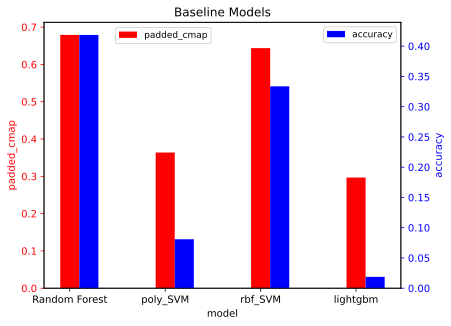

In [108]:
plt.figure(figsize=(10, 4))
fig, ax1 = plt.subplots()
plt.title('Baseline Models')
ax1.bar([0, 1, 2, 3], [metrics_dict['Random Forest'][0], metrics_dict['poly_SVM'][0], metrics_dict['rbf_SVM'][0], metrics_dict['lightgbm'][0]], label='padded_cmap', color='r', width=0.2)
ax1.set_xlabel('model')
ax1.set_xticks([0,1,2,3])
ax1.set_xticklabels(['Random Forest', 'poly_SVM', 'rbf_SVM', 'lightgbm'])
ax1.legend(loc=(0.2,0.92), fontsize=9)
ax1.set_ylabel('padded_cmap', color='r')
ax1.tick_params('y', colors='r')
ax2 = ax1.twinx()
ax2.bar([0.2, 1.2, 2.2, 3.2], [metrics_dict['Random Forest'][1], metrics_dict['poly_SVM'][1], metrics_dict['rbf_SVM'][1], metrics_dict['lightgbm'][1]], label='accuracy', color='b', width=0.2)
ax2.set_ylabel('accuracy', color='b')
ax2.tick_params('y', colors='b')
ax2.legend(loc=0, fontsize=9)
plt.show()


### The Random Forest model has the best performance, which has the highest padded cmAp score and accuracy.

# Part 3: Using the Mel-spectrogram as features for model training

## Process and save the mel-spectrogram data

In [98]:
def pad4mel(y, length, pad_mode='constant'):
    repeat = length // len(y) + 1
    y = np.tile(y, repeat)
    if len(y) < length:
        y = np.pad(y, (0, length - len(y)), pad_mode)
    elif len(y) > length:
        y = y[:length]

    return y

In [137]:
class SaveMelSpectrom:
    def __init__(self, sr=Config.sr, n_mels=128,n_fft=Config.n_fft,hop_length=Config.hop_length, fmin=Config.fmin, fmax=Config.fmax, duration=Config.duration, resample=False):
        self.sr = sr
        self.n_mels = n_mels
        self.fmin = fmin
        self.fmax = fmax or self.sr//2
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.duration = duration
        self.fix_audio_length = self.duration*self.sr
        self.resample = resample

    def getMelSpectrogram(self, wav):
        S = librosa.feature.melspectrogram(y=wav, sr=self.sr,n_fft=self.n_fft, hop_length=self.hop_length, n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax)
        S_dB = librosa.power_to_db(S, ref=np.max)
        return S_dB

    def __call__(self, row, save=True):
        audio_path = './train_audio/'
        wav, sr = librosa.load(audio_path+row.filename, sr=32000)

        if self.resample and sr != self.sr:
            wav = librosa.resample(wav, sr, self.sr)
        if row.duration < self.duration:
            wav = pad4mel(wav, self.fix_audio_length)
        save_filename = './train_mel/'+row.filename.replace('.ogg', '.npy')
        mel_path = './train_mel/'+row.filename.split('/')[0]
        if save:
            if not os.path.exists(mel_path):
                os.mkdir(mel_path)
            np.save(save_filename, self.getMelSpectrogram(wav))
        
    

In [38]:
def save_meldataset(df:pd.DataFrame):
    pool = joblib.Parallel(2)
    converter = SaveMelSpectrom()
    mapper = joblib.delayed(converter)
    tasks = [mapper(row) for row in df.itertuples(False)]
    pool(tqdm(tasks))

In [138]:
save_meldataset(df_meta)

  0%|          | 0/16941 [00:00<?, ?it/s]

## Reload and process the mel-spectrogram data

In [7]:
train_df = pd.read_csv('./train_df.csv')
test_df = pd.read_csv('./test_df.csv')

In [8]:
class BirdDataset(torch.utils.data.Dataset):

    def __init__(self, df:pd.DataFrame, sr = Config.sr, duration = Config.duration, hop_length=Config.hop_length, train_val=True):

        self.df = df
        self.sr = sr 
        self.train_val = train_val
        self.duration = duration
        self.hop_length = hop_length
        self.data_dir = Config.mel_dir
        self.crop_length = duration*sr//hop_length+1
        self.shape = (128, self.crop_length)

    def __len__(self):
        return len(self.df)

    @staticmethod
    def normalize(mel_spectrogram):
        mel_spectrogram = torch.nn.functional.normalize(mel_spectrogram, p=2, dim=0)
        return mel_spectrogram

    def __getitem__(self, idx):

        row = self.df.iloc[idx]
        mel_path = self.data_dir + f"{row.filename}".replace('.ogg', '.npy')
        audio_length = row.duration
        cat_point = np.random.randint(0, max(1, audio_length-self.duration-2))
        cat_index = int(cat_point*self.sr/self.hop_length)
        mel_data = np.load(str(mel_path))
        mel_data = mel_data[:, cat_index:cat_index+self.crop_length]
        mel_data = torch.tensor(mel_data).float()
        mel_data = self.normalize(mel_data)
        if self.train_val:
            return mel_data, torch.tensor(row[19:]).float()
        else:
            return mel_data, torch.tensor(row[18:]).float()

In [9]:
def plot_history(history): 
    plt.figure(figsize=(6, 4))
    fig, ax1 = plt.subplots()
    
    ax1.plot(history['train_loss'], 'r', label="training loss ({:.6f})".format(history['train_loss'][-1]))
    ax1.plot(history['val_loss'], 'r--', label="validation loss ({:.6f})".format(history['val_loss'][-1]))
    ax1.grid(True)
    ax1.set_xlabel('iteration')
    ax1.legend(loc="best", fontsize=9)    
    ax1.set_ylabel('loss', color='r')
    ax1.tick_params('y', colors='r')

    ax2 = ax1.twinx()
    if history.keys().__contains__('train_LRAP'):
        ax2.plot(history['train_LRAP'], 'b', label="training LRAP ({:.6f})".format(history['train_LRAP'][-1]))
    ax2.plot(history['val_LRAP'], 'b--', label="validation LRAP ({:.6f})".format(history['val_LRAP'][-1]))
    ax2.legend(loc="best", fontsize=9)
    ax2.set_ylabel('LRAP', color='b')        
    ax2.tick_params('y', colors='b')
    plt.show()

def plot_ROC_AUC(solution, submission):
    fprall = []
    tprall = []
    aucall = []
    for i in range(Config.n_class):
        fpr, tpr, thresholds = metrics.roc_curve(solution[:,i], submission[:,i])
        plt.plot(fpr, tpr, lw=0.5, alpha=0.5)
        auc = metrics.auc(fpr, tpr)
        fprall.append(fpr)
        tprall.append(tpr)
        aucall.append(auc)

    # Then interpolate all ROC curves at this points
    all_fpr = np.unique(np.concatenate(fprall))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(Config.n_class):
        mean_tpr += np.interp(all_fpr, fprall[i], tprall[i])

    # Finally average it and compute AUC
    mean_tpr /= Config.n_class

    # auc of the average ROC curve
    auc = metrics.auc(all_fpr, mean_tpr)

    # average AUC
    mc_auc = np.mean(aucall)

    plt.plot(all_fpr, mean_tpr, 'k-', lw=2)
    plt.title('MCAUC={:.4f}, AUC={:.4f}'.format(mc_auc, auc))
    plt.xlabel('FPR')
    plt.ylabel('TPR')

    plt.grid(True)  


def plot_lr_scheduler(learning_rates):
    fig, ax = plt.subplots(1,1, figsize=(10,5))
    ax.plot(range(len(learning_rates)), 
            learning_rates,
            marker='o', 
            color='black')
    ax.set_xlabel('Steps')
    ax.set_ylabel('Learning Rate')
    plt.legend()
    plt.show()


# Training with basic deep learning model in 1 Fold
+ select the fold 0 as the validation dataset
+ apply the MLP model to the mel-spectrogram data
+ apply the CNN model to the mel-spectrogram data

In [10]:
test_meldataset = BirdDataset(test_df, train_val=False)
test_loader = torch.utils.data.DataLoader(test_meldataset, batch_size=Config.batch_size, shuffle=False)

In [11]:
tmp_train_meldataset = BirdDataset(train_df[train_df['fold']!=0])
tmp_val_meldataset = BirdDataset(train_df[train_df['fold']==0])
tmp_train_loader = torch.utils.data.DataLoader(tmp_train_meldataset, batch_size=Config.batch_size, shuffle=True)
tmp_val_loader = torch.utils.data.DataLoader(tmp_val_meldataset, batch_size=Config.batch_size, shuffle=False)

In [12]:
class MLP(torch.nn.Module):
    def __init__(self, input_size=128*313, hidden_size=256, output_size=Config.n_class):
        super(MLP, self).__init__()
        self.fc1 = torch.nn.Linear(input_size, hidden_size)
        self.fc2 = torch.nn.Linear(hidden_size, hidden_size)
        self.fc3 = torch.nn.Linear(hidden_size, output_size)
        self.relu = torch.nn.ReLU()
        self.dropout = torch.nn.Dropout(0.5)
        self.softmax = torch.nn.Softmax(dim=1)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc3(x)
        # x = self.softmax(x)
        x = self.sigmoid(x)
        return x

In [13]:
# create a CNN
class CNN(torch.nn.Module):
    def __init__(self, hidden_size=256, output_size=Config.n_class):
        super(CNN, self).__init__()
        self.conv1 = torch.nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = torch.nn.Conv2d(32, 64, 3, padding=1)
        self.conv3 = torch.nn.Conv2d(64, 128, 3, padding=1)
        self.pool = torch.nn.MaxPool2d(2, 2)
        # flatten the output of the last convolutional layer
        self.fc1 = torch.nn.Linear(128*28*28, hidden_size)
        self.fc2 = torch.nn.Linear(hidden_size, hidden_size)
        self.fc3 = torch.nn.Linear(hidden_size, output_size)
        self.relu = torch.nn.ReLU()
        self.dropout = torch.nn.Dropout(0.5)
        self.sigmoid = torch.nn.Sigmoid()
        self.softmax = torch.nn.Softmax(dim=1)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc3(x)
        # x = self.softmax(x)
        x = self.sigmoid(x)
        return x

In [10]:
def get_optimizer(lr, params):
    model_optimizer = torch.optim.Adam(
            filter(lambda p: p.requires_grad, params), 
            lr=lr,
            weight_decay=Config.weight_decay
        )
    interval = "epoch"
    
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
                            model_optimizer, 
                            T_0=Config.epochs, 
                            T_mult=1, 
                            eta_min=1e-6, 
                            last_epoch=-1
                        )

    return {
        "optimizer": model_optimizer, 
        'scheduler': lr_scheduler
    }

def evaluate(history, solution, prediction, loss, phase):
    solution = np.concatenate(solution, axis=0)
    prediction = np.concatenate(prediction, axis=0)
    cmAP = padded_cmap_metrics(pd.DataFrame(solution), pd.DataFrame(prediction))
    AP_score = LR_AP(solution, prediction)
    history[phase+'_cmAP'].append(cmAP)
    history[phase+'_LRAP'].append(AP_score)
    history[phase+'_loss'].append(np.mean(loss))
    return history

def process_log(logger, save_path):
    logger.setLevel(logging.DEBUG)
    file_handler = logging.FileHandler(save_path)
    file_handler.setLevel(logging.DEBUG)

    console_handler = logging.StreamHandler()
    console_handler.setLevel(logging.INFO)

    formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
    file_handler.setFormatter(formatter)
    console_handler.setFormatter(formatter)

    logger.addHandler(file_handler)
    logger.addHandler(console_handler)
    return logger


def trans_data():
    transform = torchvision.transforms.Compose([
    torchvision.transforms.ToPILImage(),
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
])
    return transform

In [18]:
def each_step_train_model(model, criterion, transform, optimizer_dict, train_dl, channel_num=1, aug=False):
    history = {'train_loss': [], 'val_loss': [], 'train_cmAP': [], 'val_cmAP': [], 'train_LRAP': [], 'val_LRAP': []}
    train_loss = []
    train_solution = []
    train_prediction = []
    model.train()
    for i, (inputs, labels) in enumerate(train_dl):
        if channel_num !=1:
            inputs = torch.stack([transform(x.repeat(3, 1, 1)) for x in inputs])
        inputs = torch.tensor(inputs).float().to(Config.device)
        labels = torch.tensor(labels).float().to(Config.device)
        optimizer_dict['optimizer'].zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer_dict['optimizer'].step()
        train_loss.append(loss.item())
        train_solution.append(labels.detach().cpu().numpy())
        train_prediction.append(outputs.detach().cpu().numpy())
    history = evaluate(history, train_solution, train_prediction, train_loss, 'train')
    return model, history

def each_step_val_model(model, criterion, transform, val_dl, channel_num=1):
    history = {'train_loss': [], 'val_loss': [], 'train_cmAP': [], 'val_cmAP': [], 'train_LRAP': [], 'val_LRAP': []}
    val_loss = []
    val_solution = []
    val_prediction = []
    model.eval()
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(val_dl):
            if channel_num !=1:
                inputs = torch.stack([transform(x.repeat(3, 1, 1)) for x in inputs])
            inputs = torch.tensor(inputs).float().to(Config.device)
            labels = torch.tensor(labels).float().to(Config.device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss.append(loss.item())
            val_solution.append(labels.detach().cpu().numpy())
            val_prediction.append(outputs.detach().cpu().numpy())
    history = evaluate(history, val_solution, val_prediction, val_loss, 'val')
    return history

def trainer(model, criterion, transform, optimizer_dict, train_dl, val_dl, epoch_num,channel_num=1, save_path='model.pth', aug=False):
    optimizer = optimizer_dict['optimizer']
    history = {'train_loss': [], 'val_loss': [], 'train_cmAP': [], 'val_cmAP': [], 'train_LRAP': [], 'val_LRAP': []}
    logger = logging.getLogger()
    # remove previous handlers
    if logger.hasHandlers():
        logger.handlers.clear()
    logger = process_log(logger, save_path)
    scheduler_flag = False
    learning_rates = []
    if optimizer_dict['scheduler'] is not None:
        scheduler = optimizer_dict['scheduler']
        scheduler_flag = True
    for epoch in tqdm(range(epoch_num)):
        model, train_history = each_step_train_model(model, criterion, transform, optimizer_dict, train_dl, channel_num, aug)
        history['train_loss'].extend(train_history['train_loss'])
        history['train_cmAP'].extend(train_history['train_cmAP'])
        history['train_LRAP'].extend(train_history['train_LRAP'])
        val_history = each_step_val_model(model, criterion, transform, val_dl,channel_num)
        history['val_loss'].extend(val_history['val_loss'])
        history['val_cmAP'].extend(val_history['val_cmAP'])
        history['val_LRAP'].extend(val_history['val_LRAP'])
        logger.info('epoch: {}, train_loss: {:.6f}, train_cmAP: {:.6f}, train_LRAP: {:.6f}'.format(epoch+1, history['train_loss'][-1], history['train_cmAP'][-1], history['train_LRAP'][-1]))
        logger.info('epoch: {}, val_loss: {:.6f}, val_cmAP: {:.6f}, val_LRAP: {:.6f}'.format(epoch+1, history['val_loss'][-1], history['val_cmAP'][-1], history['val_LRAP'][-1]))
        if scheduler_flag:
            learning_rates.append(optimizer.param_groups[0]["lr"]) 
            scheduler.step()
    gc.collect()        
    torch.cuda.empty_cache()
    return model, history, learning_rates

def inference_model(model, test_dl, channel_num=1, transform=None):
    model.eval()
    test_solution = []
    test_prediction = []
    with torch.no_grad():
        for i, (inputs, labels) in tqdm(enumerate(test_dl)):
            if channel_num !=1:
                inputs = torch.stack([transform(x.repeat(3, 1, 1)) for x in inputs])
            inputs = torch.tensor(inputs).float().to(Config.device)
            labels = torch.tensor(labels).float().to(Config.device)
            outputs = model(inputs)
            test_solution.append(labels.detach().cpu().numpy())
            test_prediction.append(outputs.detach().cpu().numpy())
    return test_solution, test_prediction

## Use MLP (Multi-layer Perceptron) model to train the mel-spectrogram data
+ Based on the results in below, we found that the MLP model performance is not good, which may be caused by parameter setting.
+ What's more, the AUC score is not good, which means the model is not good at the prediction of the positive class.

In [17]:
transform = trans_data()
model = MLP(input_size=128*313, hidden_size=128, output_size=Config.n_class).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=Config.lr, weight_decay=Config.weight_decay), 'scheduler': None}
MLP_model, MLP_history, MLP_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader, Config.epochs, channel_num=1, save_path='MLP_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-20 22:31:46,553 - root - INFO - epoch: 1, train_loss: 0.060831, train_cmAP: 0.108907, train_LRAP: 0.053965
2023-04-20 22:31:46,561 - root - INFO - epoch: 1, val_loss: 0.031247, val_cmAP: 0.318767, val_LRAP: 0.048638
2023-04-20 22:32:45,673 - root - INFO - epoch: 2, train_loss: 0.033701, train_cmAP: 0.110150, train_LRAP: 0.059270
2023-04-20 22:32:45,674 - root - INFO - epoch: 2, val_loss: 0.029795, val_cmAP: 0.319045, val_LRAP: 0.073114
2023-04-20 22:33:45,939 - root - INFO - epoch: 3, train_loss: 0.033705, train_cmAP: 0.110315, train_LRAP: 0.054545
2023-04-20 22:33:45,940 - root - INFO - epoch: 3, val_loss: 0.029987, val_cmAP: 0.318782, val_LRAP: 0.067432
2023-04-20 22:34:43,047 - root - INFO - epoch: 4, train_loss: 0.033739, train_cmAP: 0.110193, train_LRAP: 0.055129
2023-04-20 22:34:43,047 - root - INFO - epoch: 4, val_loss: 0.034248, val_cmAP: 0.319076, val_LRAP: 0.063580
2023-04-20 22:35:41,722 - root - INFO - epoch: 5, train_loss: 0.033551, train_cmAP: 0.110145, train_LRAP

<Figure size 600x400 with 0 Axes>

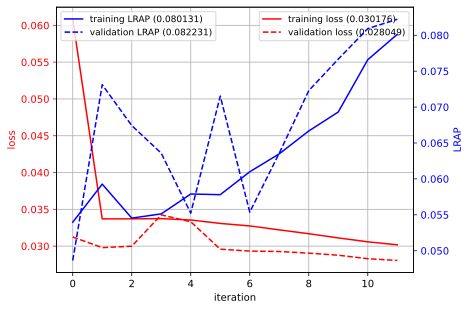

In [18]:
plot_history(MLP_history)

In [20]:
# to test dataset
test_solution, test_prediction = inference_model(MLP_model, test_loader, channel_num=1, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.274893, test_LRAP: 0.082645


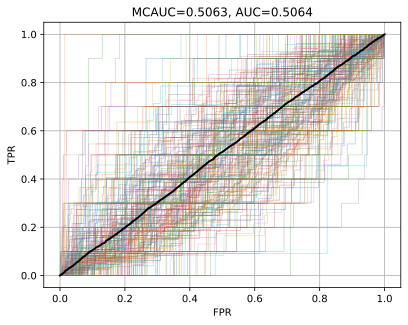

In [21]:
plot_ROC_AUC(test_solution, test_prediction)

## Using CNN model to train the mel-spectrogram data
+ Based on the results in below, we found that the CNN model has a better performance than the MLP model.
+ However, the CNN model performance improvement is not obvious, which may be caused by parameter setting.
+ What's more, the AUC score is not good, which means the model is not good at the prediction of the positive class.

In [22]:
transform = trans_data()
model = CNN(hidden_size=128, output_size=Config.n_class).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.SGD(model.parameters(), lr=0.01), 'scheduler': None}
CNN_model,  CNN_history, CNN_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader, Config.epochs, channel_num=3, save_path='CNN_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-20 22:46:17,393 - root - INFO - epoch: 1, train_loss: 0.639089, train_cmAP: 0.109996, train_LRAP: 0.024834
2023-04-20 22:46:17,425 - root - INFO - epoch: 1, val_loss: 0.327290, val_cmAP: 0.318525, val_LRAP: 0.025195
2023-04-20 22:48:02,396 - root - INFO - epoch: 2, train_loss: 0.164606, train_cmAP: 0.110032, train_LRAP: 0.026077
2023-04-20 22:48:02,396 - root - INFO - epoch: 2, val_loss: 0.032238, val_cmAP: 0.317538, val_LRAP: 0.036278
2023-04-20 22:49:47,297 - root - INFO - epoch: 3, train_loss: 0.064480, train_cmAP: 0.110020, train_LRAP: 0.030289
2023-04-20 22:49:47,297 - root - INFO - epoch: 3, val_loss: 0.032946, val_cmAP: 0.317333, val_LRAP: 0.066533
2023-04-20 22:51:30,722 - root - INFO - epoch: 4, train_loss: 0.053430, train_cmAP: 0.109964, train_LRAP: 0.031124
2023-04-20 22:51:30,723 - root - INFO - epoch: 4, val_loss: 0.032436, val_cmAP: 0.317612, val_LRAP: 0.073858
2023-04-20 22:53:10,715 - root - INFO - epoch: 5, train_loss: 0.048793, train_cmAP: 0.110248, train_LRAP

<Figure size 600x400 with 0 Axes>

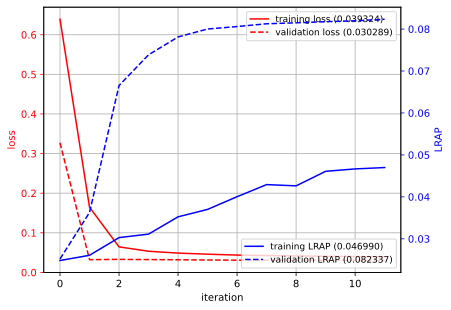

In [23]:
plot_history(CNN_history)

In [24]:
test_solution, test_prediction = inference_model(CNN_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.274186, test_LRAP: 0.081980


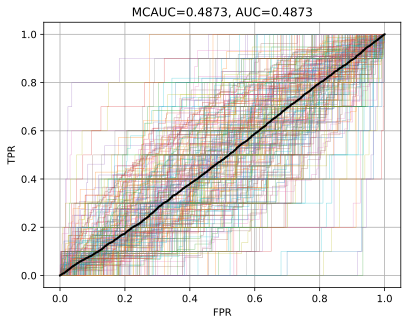

In [25]:
plot_ROC_AUC(test_solution, test_prediction)

In [12]:
class MelClassifier(torch.nn.Module):
    def __init__(self, n_class, model_name):
        super().__init__()
        if model_name == 'efficientnet_b3':
            self.model = torchvision.models.efficientnet_b3(weights='IMAGENET1K_V1')
        elif model_name == 'efficientnet_b0':
            self.model = torchvision.models.efficientnet_b0(weights='IMAGENET1K_V1')
        elif model_name == 'mobilenet_v2':
            self.model = torchvision.models.mobilenet_v2(weights='IMAGENET1K_V1')
        n_features = self.model.classifier[1].in_features
        self.model.classifier = torch.nn.Linear(n_features, n_class)
        self.sigmoid = torch.nn.Sigmoid()
        
    def forward(self, x):
        x = self.model(x)
        x = self.sigmoid(x)
        return x
    
class MelClassifierBiLSTM(torch.nn.Module):

    def __init__(self, n_class, model_name, hidden_size):
        super().__init__()
        if model_name == 'efficientnet_b3':
            self.model = torchvision.models.efficientnet_b3(weights='IMAGENET1K_V1')
        elif model_name == 'efficientnet_b0':
            self.model = torchvision.models.efficientnet_b0(weights='IMAGENET1K_V1')
        elif model_name == 'mobilenet_v2':
            self.model = torchvision.models.mobilenet_v2(weights='IMAGENET1K_V1')
        self.features = self.model.features
        self.n_features = self.model.classifier[1].in_features
        self.lstm = torch.nn.LSTM(self.n_features, hidden_size, batch_first=True, bidirectional=True)
        self.fc1 = torch.nn.Linear(hidden_size*2, hidden_size)
        self.fc2 = torch.nn.Linear(hidden_size, n_class)
        self.dropout = torch.nn.Dropout(0.4)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        x = self.features(x)
        x = x.mean([2, 3])
        x = x.unsqueeze(1)
        x, _ = self.lstm(x)
        x = x.mean(dim=1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.dropout(x)
        x = self.sigmoid(x)
        return x
        

# Training data w/o Data Augmentation
+ Using mobileNetV2 (CNN) as the model architecture
+ Using efficientnet_b3 (CNN) as the model architecture
+ Using mobilenetV2 (CNN) + Bi-LSTM (RNN) as the model architecture
+ Using efficientnet_b3 (CNN) + Bi-LSTM (RNN) as the model architecture

## Use MobileNetV2 (CNN) as the model architecture
+ Based on the result of the training with the mel-spectrogram data, we found that use MobileNetV2 (CNN) as the model architecture improve the model performance than all of previous model.
+ However, based on the history of the training, we found that the loss exist a shaking trend in one epoch, which may cause by the learning rate is too large.
+ Thus, we decide to do the fine-tune in subsequent training.

In [48]:
transform = trans_data()
model = MelClassifier(Config.n_class, model_name='mobilenet_v2').to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.01), 'scheduler': None}
mobile_model, mobile_history, mobile_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader, 
                                                                Config.epochs, channel_num=3, save_path='mobile_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-20 20:36:59,936 - root - INFO - epoch: 1, train_loss: 0.031103, train_cmAP: 0.110096, train_LRAP: 0.081504
2023-04-20 20:36:59,952 - root - INFO - epoch: 1, val_loss: 0.028319, val_cmAP: 0.320231, val_LRAP: 0.081685
2023-04-20 20:38:55,412 - root - INFO - epoch: 2, train_loss: 0.028064, train_cmAP: 0.110585, train_LRAP: 0.081744
2023-04-20 20:38:55,412 - root - INFO - epoch: 2, val_loss: 0.028030, val_cmAP: 0.321553, val_LRAP: 0.084615
2023-04-20 20:40:52,703 - root - INFO - epoch: 3, train_loss: 0.027897, train_cmAP: 0.112264, train_LRAP: 0.087881
2023-04-20 20:40:52,703 - root - INFO - epoch: 3, val_loss: 0.027913, val_cmAP: 0.325550, val_LRAP: 0.086496
2023-04-20 20:42:49,741 - root - INFO - epoch: 4, train_loss: 0.027630, train_cmAP: 0.114198, train_LRAP: 0.097481
2023-04-20 20:42:49,741 - root - INFO - epoch: 4, val_loss: 0.027861, val_cmAP: 0.331495, val_LRAP: 0.101712
2023-04-20 20:44:46,813 - root - INFO - epoch: 5, train_loss: 0.027403, train_cmAP: 0.115856, train_LRAP

<Figure size 600x400 with 0 Axes>

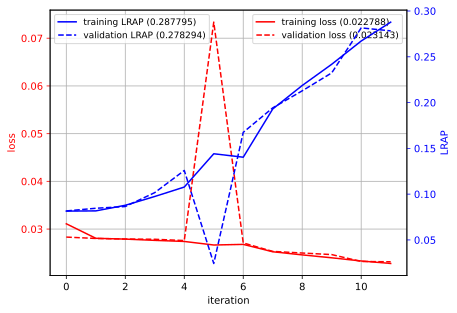

In [49]:
plot_history(mobile_history)

In [50]:
test_solution, test_prediction = inference_model(mobile_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.390186, test_LRAP: 0.276722


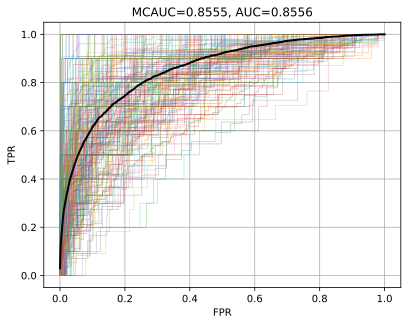

In [51]:
plot_ROC_AUC(test_solution, test_prediction)

## Use EfficientNet_b3 (CNN) as the model architecture:
+ Based on the result of the training with the mel-spectrogram data, we found that use EfficientNet_b3 (CNN) as the model architecture improve the model performance than all of previous model.
+ However, it also exist the shaking trend in one epoch, which is similar to the MobileNetV2 (CNN) model.

In [29]:
transform = trans_data()
model = MelClassifier(Config.n_class, 'efficientnet_b3').to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.01), 'scheduler': None}
efficient_model, efficient_history, efficient_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader, 
                                                                         Config.epochs, channel_num=3, save_path='efficientb3_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-20 23:11:22,122 - root - INFO - epoch: 1, train_loss: 0.034587, train_cmAP: 0.109938, train_LRAP: 0.069874
2023-04-20 23:11:22,160 - root - INFO - epoch: 1, val_loss: 0.028923, val_cmAP: 0.322021, val_LRAP: 0.076257
2023-04-20 23:13:52,397 - root - INFO - epoch: 2, train_loss: 0.028262, train_cmAP: 0.112474, train_LRAP: 0.084362
2023-04-20 23:13:52,398 - root - INFO - epoch: 2, val_loss: 0.028982, val_cmAP: 0.327496, val_LRAP: 0.083501
2023-04-20 23:16:21,277 - root - INFO - epoch: 3, train_loss: 0.026793, train_cmAP: 0.125848, train_LRAP: 0.138096
2023-04-20 23:16:21,278 - root - INFO - epoch: 3, val_loss: 0.033390, val_cmAP: 0.371024, val_LRAP: 0.168299
2023-04-20 23:18:51,724 - root - INFO - epoch: 4, train_loss: 0.024490, train_cmAP: 0.157219, train_LRAP: 0.232404
2023-04-20 23:18:51,724 - root - INFO - epoch: 4, val_loss: 0.025594, val_cmAP: 0.412858, val_LRAP: 0.216462
2023-04-20 23:21:22,033 - root - INFO - epoch: 5, train_loss: 0.022719, train_cmAP: 0.197307, train_LRAP

<Figure size 600x400 with 0 Axes>

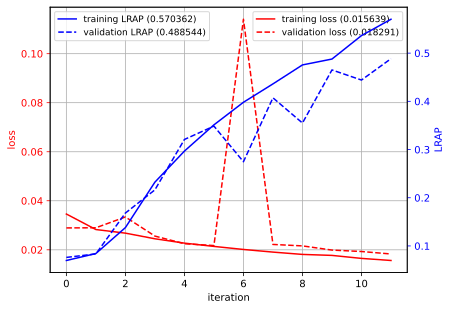

In [30]:
plot_history(efficient_history)

In [31]:
test_solution, test_prediction = inference_model(efficient_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.591540, test_LRAP: 0.490457


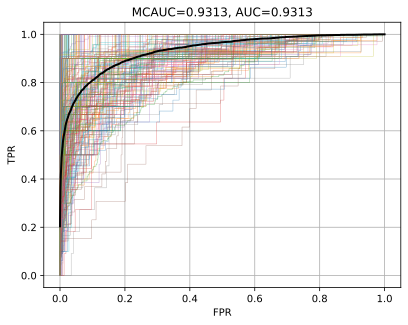

In [32]:
plot_ROC_AUC(test_solution, test_prediction)

## Use MobileNetV2 (CNN) + Bi-LSTM (RNN) as the model architecture

In [72]:
transform = trans_data()
model = MelClassifierBiLSTM(Config.n_class, 'mobilenet_v2', 128).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.0001), 'scheduler': None}
mobile_bilstm_model, mobile_bilstm_history, mobile_bilstm_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                                                        Config.epochs, channel_num=3, save_path='mobile_bilstm_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 01:14:33,646 - root - INFO - epoch: 1, train_loss: 0.332693, train_cmAP: 0.108830, train_LRAP: 0.010039
2023-04-21 01:14:33,646 - root - INFO - epoch: 1, val_loss: 0.050710, val_cmAP: 0.320642, val_LRAP: 0.081298
2023-04-21 01:16:23,019 - root - INFO - epoch: 2, train_loss: 0.293795, train_cmAP: 0.107847, train_LRAP: 0.008956
2023-04-21 01:16:23,020 - root - INFO - epoch: 2, val_loss: 0.049873, val_cmAP: 0.321634, val_LRAP: 0.080973
2023-04-21 01:18:11,763 - root - INFO - epoch: 3, train_loss: 0.293886, train_cmAP: 0.107900, train_LRAP: 0.008928
2023-04-21 01:18:11,763 - root - INFO - epoch: 3, val_loss: 0.049315, val_cmAP: 0.324060, val_LRAP: 0.081727
2023-04-21 01:20:01,251 - root - INFO - epoch: 4, train_loss: 0.293676, train_cmAP: 0.108050, train_LRAP: 0.008962
2023-04-21 01:20:01,252 - root - INFO - epoch: 4, val_loss: 0.050573, val_cmAP: 0.327398, val_LRAP: 0.102998
2023-04-21 01:21:49,343 - root - INFO - epoch: 5, train_loss: 0.293395, train_cmAP: 0.108238, train_LRAP

<Figure size 600x400 with 0 Axes>

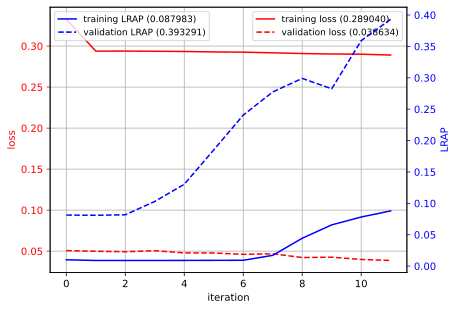

In [73]:
plot_history(mobile_bilstm_history)

In [74]:
test_solution, test_prediction = inference_model(mobile_bilstm_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.465032, test_LRAP: 0.393472


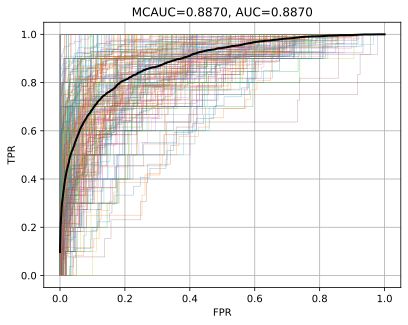

In [75]:
plot_ROC_AUC(test_solution, test_prediction)

# Fine-tune the learning rate for the model training
+ According to the plot of the history, we found the loss exist a shaking, which means the learning rate is too large.
+ we tried to increase the learning rate: $[0.0005, 0.00005, 0.00001]$, and found that the loss decrease and LRAP increase rationally

In [76]:
lr_list = [0.0005, 0.00005, 0.00001]
mobile_bilstm_model_list = []
mobile_bilstm_history_list = []
mobile_bilstm_lr_list_list = []
for lr in lr_list:
    print('learning rate: {}'.format(lr))
    transform = trans_data()
    model = MelClassifierBiLSTM(Config.n_class, 'mobilenet_v2', 128).to(Config.device)
    next(model.parameters()).device
    criterion = torch.nn.BCELoss()
    optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=lr), 'scheduler': None}
    mobile_bilstm_model, mobile_bilstm_history, mobile_bilstm_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                                                            Config.epochs, channel_num=3, 
                                                                                            save_path='mobile_bilstm_model_lr{}.log'.format(str(lr).split('.')[-1]))
    mobile_bilstm_model_list.append(mobile_bilstm_model)
    mobile_bilstm_history_list.append(mobile_bilstm_history)
    mobile_bilstm_lr_list_list.append(mobile_bilstm_lr_list)
    print('====================================================================================================')

learning rate: 0.0005


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 01:48:06,384 - root - INFO - epoch: 1, train_loss: 0.304248, train_cmAP: 0.108390, train_LRAP: 0.009127
2023-04-21 01:48:06,384 - root - INFO - epoch: 1, val_loss: 0.050680, val_cmAP: 0.321395, val_LRAP: 0.077167
2023-04-21 01:49:56,692 - root - INFO - epoch: 2, train_loss: 0.294390, train_cmAP: 0.107838, train_LRAP: 0.008858
2023-04-21 01:49:56,692 - root - INFO - epoch: 2, val_loss: 0.052050, val_cmAP: 0.321641, val_LRAP: 0.077736
2023-04-21 01:51:50,854 - root - INFO - epoch: 3, train_loss: 0.294019, train_cmAP: 0.108017, train_LRAP: 0.008922
2023-04-21 01:51:50,855 - root - INFO - epoch: 3, val_loss: 0.049507, val_cmAP: 0.325108, val_LRAP: 0.102305
2023-04-21 01:53:44,033 - root - INFO - epoch: 4, train_loss: 0.293598, train_cmAP: 0.108186, train_LRAP: 0.009025
2023-04-21 01:53:44,033 - root - INFO - epoch: 4, val_loss: 0.048392, val_cmAP: 0.330413, val_LRAP: 0.116702
2023-04-21 01:55:33,071 - root - INFO - epoch: 5, train_loss: 0.292905, train_cmAP: 0.108417, train_LRAP

learning rate: 5e-05


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 02:10:07,463 - root - INFO - epoch: 1, train_loss: 0.364375, train_cmAP: 0.109258, train_LRAP: 0.010814
2023-04-21 02:10:07,464 - root - INFO - epoch: 1, val_loss: 0.056891, val_cmAP: 0.318219, val_LRAP: 0.074290
2023-04-21 02:11:56,504 - root - INFO - epoch: 2, train_loss: 0.294261, train_cmAP: 0.107815, train_LRAP: 0.008909
2023-04-21 02:11:56,505 - root - INFO - epoch: 2, val_loss: 0.050759, val_cmAP: 0.321227, val_LRAP: 0.082096
2023-04-21 02:13:46,441 - root - INFO - epoch: 3, train_loss: 0.293775, train_cmAP: 0.107849, train_LRAP: 0.008924
2023-04-21 02:13:46,442 - root - INFO - epoch: 3, val_loss: 0.050626, val_cmAP: 0.322612, val_LRAP: 0.081947
2023-04-21 02:15:38,206 - root - INFO - epoch: 4, train_loss: 0.293656, train_cmAP: 0.107885, train_LRAP: 0.008939
2023-04-21 02:15:38,206 - root - INFO - epoch: 4, val_loss: 0.050405, val_cmAP: 0.324196, val_LRAP: 0.083065
2023-04-21 02:17:27,202 - root - INFO - epoch: 5, train_loss: 0.294110, train_cmAP: 0.107950, train_LRAP

learning rate: 1e-05


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 02:32:10,234 - root - INFO - epoch: 1, train_loss: 0.551002, train_cmAP: 0.109533, train_LRAP: 0.019447
2023-04-21 02:32:10,234 - root - INFO - epoch: 1, val_loss: 0.285906, val_cmAP: 0.317513, val_LRAP: 0.025474
2023-04-21 02:33:59,428 - root - INFO - epoch: 2, train_loss: 0.328419, train_cmAP: 0.107896, train_LRAP: 0.008686
2023-04-21 02:33:59,429 - root - INFO - epoch: 2, val_loss: 0.112363, val_cmAP: 0.317566, val_LRAP: 0.026702
2023-04-21 02:35:49,093 - root - INFO - epoch: 3, train_loss: 0.299385, train_cmAP: 0.107865, train_LRAP: 0.008298
2023-04-21 02:35:49,093 - root - INFO - epoch: 3, val_loss: 0.074093, val_cmAP: 0.317760, val_LRAP: 0.033288
2023-04-21 02:37:40,954 - root - INFO - epoch: 4, train_loss: 0.295297, train_cmAP: 0.107867, train_LRAP: 0.008591
2023-04-21 02:37:40,955 - root - INFO - epoch: 4, val_loss: 0.060915, val_cmAP: 0.318285, val_LRAP: 0.057604
2023-04-21 02:39:32,751 - root - INFO - epoch: 5, train_loss: 0.294673, train_cmAP: 0.107829, train_LRAP

## Use EfficientNet_b3 (CNN) + Bi-LSTM (RNN) as the model architecture

In [84]:
transform = trans_data()
model = MelClassifierBiLSTM(Config.n_class, 'efficientnet_b3',128).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.0001), 'scheduler': None}
efficient_bilstm_model, efficient_bilstm_history, efficient_bilstm_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                                                             Config.epochs, channel_num=3, save_path='efficient_bilstm_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 05:14:51,757 - root - INFO - epoch: 1, train_loss: 0.334447, train_cmAP: 0.109115, train_LRAP: 0.010254
2023-04-21 05:14:51,757 - root - INFO - epoch: 1, val_loss: 0.051089, val_cmAP: 0.319810, val_LRAP: 0.082041
2023-04-21 05:17:22,532 - root - INFO - epoch: 2, train_loss: 0.294093, train_cmAP: 0.107865, train_LRAP: 0.008945
2023-04-21 05:17:22,533 - root - INFO - epoch: 2, val_loss: 0.050125, val_cmAP: 0.321994, val_LRAP: 0.082556
2023-04-21 05:19:53,402 - root - INFO - epoch: 3, train_loss: 0.293884, train_cmAP: 0.107884, train_LRAP: 0.008955
2023-04-21 05:19:53,403 - root - INFO - epoch: 3, val_loss: 0.049876, val_cmAP: 0.324051, val_LRAP: 0.082478
2023-04-21 05:22:23,729 - root - INFO - epoch: 4, train_loss: 0.293567, train_cmAP: 0.107946, train_LRAP: 0.008948
2023-04-21 05:22:23,729 - root - INFO - epoch: 4, val_loss: 0.050407, val_cmAP: 0.324696, val_LRAP: 0.090112
2023-04-21 05:24:55,288 - root - INFO - epoch: 5, train_loss: 0.293897, train_cmAP: 0.108026, train_LRAP

<Figure size 600x400 with 0 Axes>

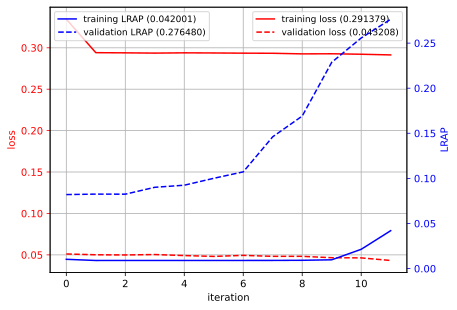

In [86]:
plot_history(efficient_bilstm_history)

In [85]:
test_solution, test_prediction = inference_model(efficient_bilstm_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.357908, test_LRAP: 0.279315


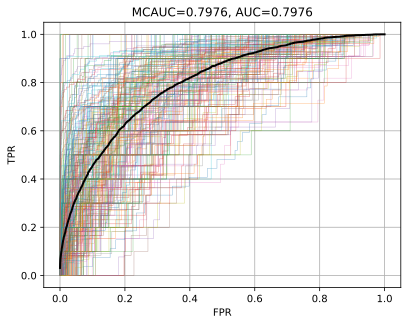

In [87]:
plot_ROC_AUC(test_solution, test_prediction)

# Fine-tune the learning rate for the model training
+ According to the plot of the history, we found the loss decrease and LRAP increase to slowly, which means the learning rate is too small.
+ we tried to increase the learning rate: $[0.001, 0.0005, 0.00005]$, and found that the loss decrease and LRAP increase rationally

In [90]:
lr_list = [0.001, 0.0005, 0.00005]
efficient_bilstm_model_list = []
efficient_bilstm_history_list = []
efficient_bilstm_lr_list_list = []
for lr in lr_list:
    print('learning rate: {}'.format(lr))
    transform = trans_data()
    model = MelClassifierBiLSTM(Config.n_class, 'efficientnet_b3', 128).to(Config.device)
    next(model.parameters()).device
    criterion = torch.nn.BCELoss()
    optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=lr), 'scheduler': None}
    efficient_bilstm_model, efficient_bilstm_history, efficient_bilstm_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                                                            Config.epochs, channel_num=3, 
                                                                                            save_path='efficient_bilstm_model_lr{}.log'.format(str(lr).split('.')[-1]))
    efficient_bilstm_model_list.append(efficient_bilstm_model)
    efficient_bilstm_history_list.append(efficient_bilstm_history)
    efficient_bilstm_lr_list_list.append(efficient_bilstm_lr_list)
    print('====================================================================================================')

learning rate: 0.001


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 05:52:29,036 - root - INFO - epoch: 1, train_loss: 0.301111, train_cmAP: 0.108432, train_LRAP: 0.009203
2023-04-21 05:52:29,037 - root - INFO - epoch: 1, val_loss: 0.048966, val_cmAP: 0.322674, val_LRAP: 0.073047
2023-04-21 05:55:00,181 - root - INFO - epoch: 2, train_loss: 0.294567, train_cmAP: 0.107939, train_LRAP: 0.008821
2023-04-21 05:55:00,182 - root - INFO - epoch: 2, val_loss: 0.050682, val_cmAP: 0.324384, val_LRAP: 0.093855
2023-04-21 05:57:32,358 - root - INFO - epoch: 3, train_loss: 0.293813, train_cmAP: 0.108142, train_LRAP: 0.008940
2023-04-21 05:57:32,359 - root - INFO - epoch: 3, val_loss: 0.046563, val_cmAP: 0.322904, val_LRAP: 0.094012
2023-04-21 06:00:03,792 - root - INFO - epoch: 4, train_loss: 0.293306, train_cmAP: 0.108338, train_LRAP: 0.009069
2023-04-21 06:00:03,793 - root - INFO - epoch: 4, val_loss: 0.042205, val_cmAP: 0.344776, val_LRAP: 0.155874
2023-04-21 06:02:35,635 - root - INFO - epoch: 5, train_loss: 0.292831, train_cmAP: 0.109345, train_LRAP

learning rate: 0.0005


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 06:22:58,589 - root - INFO - epoch: 1, train_loss: 0.305084, train_cmAP: 0.108503, train_LRAP: 0.009484
2023-04-21 06:22:58,589 - root - INFO - epoch: 1, val_loss: 0.049098, val_cmAP: 0.321144, val_LRAP: 0.073666
2023-04-21 06:25:30,415 - root - INFO - epoch: 2, train_loss: 0.294527, train_cmAP: 0.107874, train_LRAP: 0.008841
2023-04-21 06:25:30,416 - root - INFO - epoch: 2, val_loss: 0.050876, val_cmAP: 0.324819, val_LRAP: 0.089417
2023-04-21 06:28:02,544 - root - INFO - epoch: 3, train_loss: 0.293785, train_cmAP: 0.108145, train_LRAP: 0.008972
2023-04-21 06:28:02,545 - root - INFO - epoch: 3, val_loss: 0.048699, val_cmAP: 0.332850, val_LRAP: 0.117522
2023-04-21 06:30:34,781 - root - INFO - epoch: 4, train_loss: 0.293490, train_cmAP: 0.108422, train_LRAP: 0.009119
2023-04-21 06:30:34,782 - root - INFO - epoch: 4, val_loss: 0.046431, val_cmAP: 0.351711, val_LRAP: 0.176456
2023-04-21 06:33:07,114 - root - INFO - epoch: 5, train_loss: 0.292115, train_cmAP: 0.110108, train_LRAP

learning rate: 5e-05


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 06:53:20,827 - root - INFO - epoch: 1, train_loss: 0.365122, train_cmAP: 0.108739, train_LRAP: 0.011619
2023-04-21 06:53:20,828 - root - INFO - epoch: 1, val_loss: 0.054933, val_cmAP: 0.319656, val_LRAP: 0.078781
2023-04-21 06:55:54,228 - root - INFO - epoch: 2, train_loss: 0.293924, train_cmAP: 0.107863, train_LRAP: 0.008926
2023-04-21 06:55:54,228 - root - INFO - epoch: 2, val_loss: 0.050600, val_cmAP: 0.320871, val_LRAP: 0.083199
2023-04-21 06:58:26,900 - root - INFO - epoch: 3, train_loss: 0.293911, train_cmAP: 0.107846, train_LRAP: 0.008946
2023-04-21 06:58:26,900 - root - INFO - epoch: 3, val_loss: 0.050104, val_cmAP: 0.321419, val_LRAP: 0.082073
2023-04-21 07:00:58,687 - root - INFO - epoch: 4, train_loss: 0.293947, train_cmAP: 0.107899, train_LRAP: 0.008948
2023-04-21 07:00:58,688 - root - INFO - epoch: 4, val_loss: 0.049999, val_cmAP: 0.322229, val_LRAP: 0.082195
2023-04-21 07:03:31,020 - root - INFO - epoch: 5, train_loss: 0.294283, train_cmAP: 0.107898, train_LRAP

## Finetine structure of the model architecture
+ After found the a good learning rate, we will fine-tune the model structure to get a better performance.
+ we change the hidden layer size of the Linear layer when concat the CNN and RNN model.
+ we select 128 and 512 as the hidden layer size of the Linear layer when concat the CNN and RNN model.

In [93]:
transform = trans_data()
model = MelClassifierBiLSTM(Config.n_class, 'efficientnet_b3', 512).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.001), 'scheduler': None}
efficient_bilstm512_model, efficient_bilstm512_history, efficient_bilstm512_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                                                             Config.epochs, channel_num=3, save_path='efficient_bilstm512_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 07:41:06,708 - root - INFO - epoch: 1, train_loss: 0.298581, train_cmAP: 0.108467, train_LRAP: 0.008841
2023-04-21 07:41:06,708 - root - INFO - epoch: 1, val_loss: 0.044384, val_cmAP: 0.329758, val_LRAP: 0.111214
2023-04-21 07:43:38,947 - root - INFO - epoch: 2, train_loss: 0.292737, train_cmAP: 0.110734, train_LRAP: 0.020348
2023-04-21 07:43:38,948 - root - INFO - epoch: 2, val_loss: 0.038839, val_cmAP: 0.418666, val_LRAP: 0.265149
2023-04-21 07:46:14,078 - root - INFO - epoch: 3, train_loss: 0.290984, train_cmAP: 0.123096, train_LRAP: 0.061313
2023-04-21 07:46:14,079 - root - INFO - epoch: 3, val_loss: 0.052300, val_cmAP: 0.327164, val_LRAP: 0.067594
2023-04-21 07:48:44,528 - root - INFO - epoch: 4, train_loss: 0.291898, train_cmAP: 0.115333, train_LRAP: 0.040304
2023-04-21 07:48:44,530 - root - INFO - epoch: 4, val_loss: 0.037519, val_cmAP: 0.466104, val_LRAP: 0.308337
2023-04-21 07:51:15,822 - root - INFO - epoch: 5, train_loss: 0.289946, train_cmAP: 0.130033, train_LRAP

<Figure size 600x400 with 0 Axes>

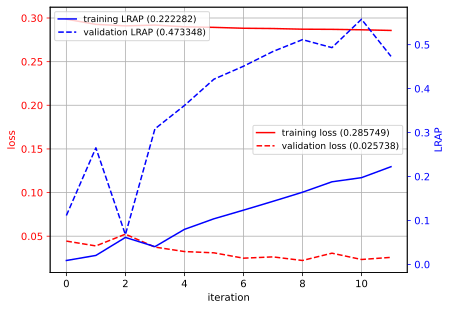

In [94]:
plot_history(efficient_bilstm512_history)

In [95]:
test_solution, test_prediction = inference_model(efficient_bilstm512_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.573605, test_LRAP: 0.474802


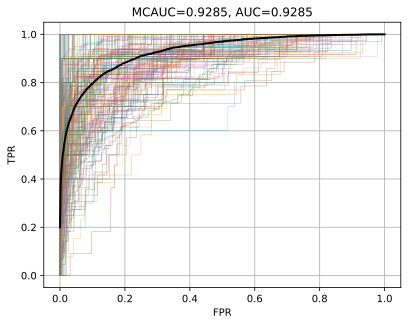

In [96]:
plot_ROC_AUC(test_solution, test_prediction)

In [99]:
transform = trans_data()
model = MelClassifierBiLSTM(Config.n_class, 'efficientnet_b3', 512).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.0005), 'scheduler': None}
efficient_bilstm512_model, efficient_bilstm512_history, efficient_bilstm512_lr_list = trainer(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                                                             Config.epochs, channel_num=3, save_path='efficient_bilstm512_model.log')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 08:19:24,119 - root - INFO - epoch: 1, train_loss: 0.300049, train_cmAP: 0.108362, train_LRAP: 0.009013
2023-04-21 08:19:24,119 - root - INFO - epoch: 1, val_loss: 0.046963, val_cmAP: 0.333467, val_LRAP: 0.113363
2023-04-21 08:21:54,382 - root - INFO - epoch: 2, train_loss: 0.292800, train_cmAP: 0.111104, train_LRAP: 0.023188
2023-04-21 08:21:54,382 - root - INFO - epoch: 2, val_loss: 0.043106, val_cmAP: 0.418457, val_LRAP: 0.274864
2023-04-21 08:24:23,852 - root - INFO - epoch: 3, train_loss: 0.290452, train_cmAP: 0.124100, train_LRAP: 0.069156
2023-04-21 08:24:23,853 - root - INFO - epoch: 3, val_loss: 0.030705, val_cmAP: 0.504136, val_LRAP: 0.370440
2023-04-21 08:26:53,797 - root - INFO - epoch: 4, train_loss: 0.289067, train_cmAP: 0.145421, train_LRAP: 0.108133
2023-04-21 08:26:53,798 - root - INFO - epoch: 4, val_loss: 0.032626, val_cmAP: 0.560186, val_LRAP: 0.436109
2023-04-21 08:29:25,143 - root - INFO - epoch: 5, train_loss: 0.287555, train_cmAP: 0.169151, train_LRAP

<Figure size 600x400 with 0 Axes>

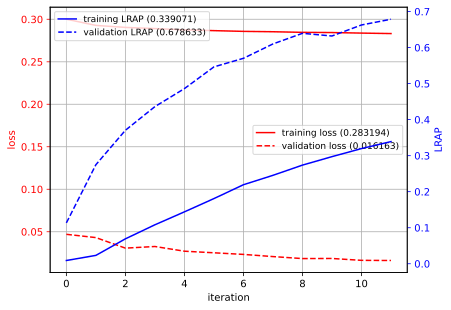

In [100]:
plot_history(efficient_bilstm512_history)

In [101]:
test_solution, test_prediction = inference_model(efficient_bilstm512_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.747638, test_LRAP: 0.689057


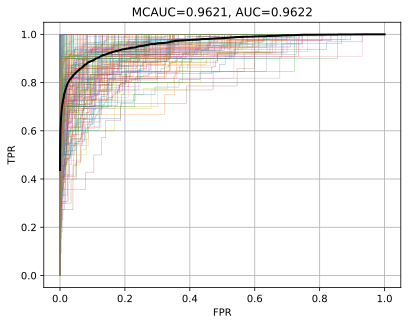

In [102]:
plot_ROC_AUC(test_solution, test_prediction)

# Training data with Data Augmentation
+ select the best model architecture from the previous training
+ apply the Mixup
+ apply the CutMix


In [15]:
# utils for augmentations
from torchtoolbox.tools import mixup_data, mixup_criterion

# use cutmix
def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = np.int(W * cut_rat)
    cut_h = np.int(H * cut_rat)

    # uniform
    cx = np.random.randint(W)
    cy = np.random.randint(H)

    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

def cutmix_data(data, target, alpha):
    indices = torch.randperm(data.size(0))
    shuffled_data = data[indices]
    shuffled_target = target[indices]

    lam = np.clip(np.random.beta(alpha, alpha),0.3,0.4)
    bbx1, bby1, bbx2, bby2 = rand_bbox(data.size(), lam)
    new_data = data.clone()
    new_data[:, :, bby1:bby2, bbx1:bbx2] = data[indices, :, bby1:bby2, bbx1:bbx2]
    # adjust lambda to exactly match pixel ratio
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (data.size()[-1] * data.size()[-2]))
    targets = (target, shuffled_target, lam)

    return new_data, targets

# What are the Mixup and CutMix?
+ Mixup: Mixup, a simple learning principle to alleviate these issues. In essence, mixup trains a neural network on convex combinations of pairs of examples and their labels from [mixup: Beyond Empirical Risk Minimization](https://arxiv.org/pdf/1710.09412.pdf)
+ CutMix: CutMix augmentation strategy: patches are cut and pasted among training images where the ground truth labels are also mixed proportionally to the area of the patches from [CutMix: Regularization Strategy to Train Strong Classifiers with Localizable Features](https://arxiv.org/pdf/1905.04899.pdf)


![image](./asset/mixup_cutmix.png)

## Here are the examples of the Mixup and CutMix in the Mel-spectrogram data
1. shows the original mel-spectrogram data and the Mixup mel-spectrogram data
2. shows the original mel-spectrogram data and the CutMix mel-spectrogram data

<Figure size 1000x400 with 0 Axes>

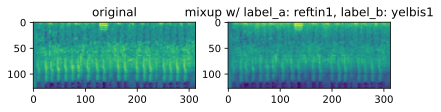

In [36]:
# show mixup image from bathch
label_list = train_df['primary_label'].unique().tolist()
for i, (data, target) in enumerate(test_loader):
    data, target = data.to(Config.device), target.to(Config.device)
    mixupdata, label_a, label_b, lam = mixup_data(data, target, 0.5)
    plt.figure(figsize=(10,4))
    fig, ax = plt.subplots(1, 2)
    ax[0].title.set_text('original')
    ax[0].imshow(data[0].cpu().detach().numpy())
    label_a0 = label_list[np.where(label_a[0].cpu().detach().numpy() == 1)[0][0]]
    label_b0 = label_list[np.where(label_b[0].cpu().detach().numpy() == 1)[0][0]]
    ax[1].title.set_text('mixup w/ label_a: {}, label_b: {}'.format(label_a0, label_b0))
    ax[1].imshow(mixupdata[0].cpu().detach().numpy())
    plt.show()
    break


<Figure size 600x400 with 0 Axes>

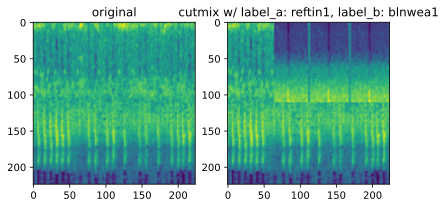

In [37]:
label_list = train_df['primary_label'].unique().tolist()
transform = trans_data()
for i, (data, target) in enumerate(test_loader):
    data, target = data.to(Config.device), target.to(Config.device)
    data = torch.stack([transform(x.repeat(3, 1, 1)) for x in data])
    cutmixdata, cutmixtargets = cutmix_data(data, target, 0.2)
    label_a = cutmixtargets[0]
    label_b = cutmixtargets[1]
    label_a = label_list[np.where(label_a[0].cpu().detach().numpy() == 1)[0][0]]
    label_b = label_list[np.where(label_b[0].cpu().detach().numpy() == 1)[0][0]]
    plt.figure(figsize=(6,4))
    fig, ax = plt.subplots(1, 2)
    ax[0].title.set_text('original')
    ax[0].imshow(data[0][0].cpu().detach().numpy())
    ax[1].title.set_text('cutmix w/ label_a: {}, label_b: {}'.format(label_a, label_b))
    ax[1].imshow(cutmixdata[0][0].cpu().detach().numpy())
    break

In [16]:
def each_step_train_aug(model, criterion, transform, optimizer_dict, train_dl, channel_num=1, aug=False):
        history = {'train_loss': []}
        train_loss = []
        model.train()
        for i, (inputs, labels) in enumerate(train_dl):
            if channel_num !=1:
                inputs = torch.stack([transform(x.repeat(3, 1, 1)) for x in inputs])
            inputs = torch.tensor(inputs).float().to(Config.device)
            labels = torch.tensor(labels).float().to(Config.device)
            if aug=='mix_up':
                inputs, labels_a, labels_b, lam = mixup_data(inputs, labels, alpha=Config.mix_up_alpha)
            elif aug=='cut_mix':
                inputs, labels = cutmix_data(inputs, labels, 1.)
            else:
                pass
            optimizer_dict['optimizer'].zero_grad()
            outputs = model(inputs)
            if aug=='cut_mix':
                loss = criterion(outputs, labels[0]) * labels[2] + criterion(outputs, labels[1]) * (1. - labels[2])
            elif aug=='mix_up':
                loss = mixup_criterion(torch.nn.functional.binary_cross_entropy, outputs, labels_a, labels_b, lam)
            else:
                loss = criterion(outputs, labels)
            loss.backward()
            optimizer_dict['optimizer'].step()
            train_loss.append(loss.item())
        history['train_loss'].append(np.mean(train_loss))
        return model, history

def trainer_with_aug(model, criterion, transform, optimizer_dict, train_dl, val_dl, epoch_num,channel_num=1, save_path='model.pth', aug=False):
    optimizer = optimizer_dict['optimizer']
    history = {'train_loss': [], 'val_loss': [],  'val_cmAP': [], 'val_LRAP': []}
    logger = logging.getLogger()
    # remove previous handlers
    if logger.hasHandlers():
        logger.handlers.clear()
    logger = process_log(logger, save_path)
    scheduler_flag = False
    learning_rates = []
    if optimizer_dict['scheduler'] is not None:
        scheduler = optimizer_dict['scheduler']
        scheduler_flag = True
    for epoch in tqdm(range(epoch_num)):
        model, train_history = each_step_train_aug(model, criterion, transform, optimizer_dict, train_dl, channel_num, aug)
        history['train_loss'].extend(train_history['train_loss'])
        val_history = each_step_val_model(model, criterion, transform, val_dl,channel_num)
        history['val_loss'].extend(val_history['val_loss'])
        history['val_cmAP'].extend(val_history['val_cmAP'])
        history['val_LRAP'].extend(val_history['val_LRAP'])
        logger.info('epoch: {}, train_loss: {:.6f}'.format(epoch+1, history['train_loss'][-1]))
        logger.info('epoch: {}, val_loss: {:.6f}, val_cmAP: {:.6f}, val_LRAP: {:.6f}'.format(epoch+1, history['val_loss'][-1], history['val_cmAP'][-1], history['val_LRAP'][-1]))
        if scheduler_flag:
            learning_rates.append(optimizer.param_groups[0]["lr"]) 
            scheduler.step()
    gc.collect()        
    torch.cuda.empty_cache()
    return model, history, learning_rates

## 1. use mixup to augment the training data

In [17]:
transform = trans_data()
model = MelClassifierBiLSTM(Config.n_class, 'efficientnet_b3', 512).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.0001), 'scheduler': None}
mixup_model, mixup_history, mixup_lr_list = trainer_with_aug(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                                                             Config.epochs, channel_num=3, save_path='mixup_model.log', aug='mix_up')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 10:52:32,398 - root - INFO - epoch: 1, train_loss: 0.312042
2023-04-21 10:52:32,399 - root - INFO - epoch: 1, val_loss: 0.050761, val_cmAP: 0.319565, val_LRAP: 0.076954
2023-04-21 10:54:55,165 - root - INFO - epoch: 2, train_loss: 0.294288
2023-04-21 10:54:55,166 - root - INFO - epoch: 2, val_loss: 0.051792, val_cmAP: 0.320750, val_LRAP: 0.088489
2023-04-21 10:57:17,386 - root - INFO - epoch: 3, train_loss: 0.293848
2023-04-21 10:57:17,387 - root - INFO - epoch: 3, val_loss: 0.052473, val_cmAP: 0.326744, val_LRAP: 0.106591
2023-04-21 10:59:39,396 - root - INFO - epoch: 4, train_loss: 0.293892
2023-04-21 10:59:39,398 - root - INFO - epoch: 4, val_loss: 0.049471, val_cmAP: 0.344348, val_LRAP: 0.165545
2023-04-21 11:01:59,901 - root - INFO - epoch: 5, train_loss: 0.292751
2023-04-21 11:01:59,902 - root - INFO - epoch: 5, val_loss: 0.046955, val_cmAP: 0.380731, val_LRAP: 0.233283
2023-04-21 11:04:22,028 - root - INFO - epoch: 6, train_loss: 0.291950
2023-04-21 11:04:22,029 - roo

<Figure size 600x400 with 0 Axes>

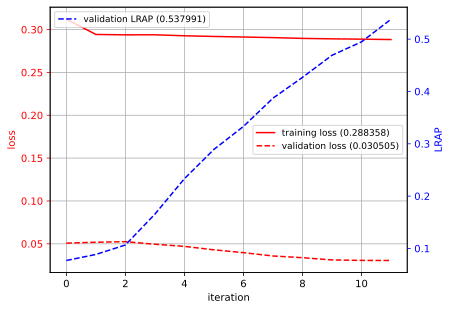

In [18]:
plot_history(mixup_history)

In [19]:
test_solution, test_prediction = inference_model(mixup_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.605327, test_LRAP: 0.543125


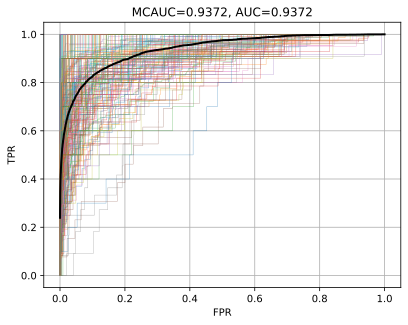

In [20]:
plot_ROC_AUC(test_solution, test_prediction)

# 2. use cutmix to augment the training data

In [24]:
transform = trans_data()
model = MelClassifierBiLSTM(Config.n_class, 'efficientnet_b3', 512).to(Config.device)
next(model.parameters()).device
criterion = torch.nn.BCELoss()
optimizer_dict = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.0005), 'scheduler': None}
cutmix_model, cutmix_history, cutmix_lr_list = trainer_with_aug(model, criterion, transform, optimizer_dict, tmp_train_loader, tmp_val_loader,
                                                        Config.epochs, channel_num=3, save_path='cutmix_model.log', aug='cut_mix')

  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 09:39:14,489 - root - INFO - epoch: 1, train_loss: 0.300131
2023-04-21 09:39:14,490 - root - INFO - epoch: 1, val_loss: 0.052888, val_cmAP: 0.322641, val_LRAP: 0.086856
2023-04-21 09:41:34,427 - root - INFO - epoch: 2, train_loss: 0.294324
2023-04-21 09:41:34,428 - root - INFO - epoch: 2, val_loss: 0.050524, val_cmAP: 0.341112, val_LRAP: 0.128917
2023-04-21 09:43:56,624 - root - INFO - epoch: 3, train_loss: 0.293665
2023-04-21 09:43:56,624 - root - INFO - epoch: 3, val_loss: 0.047486, val_cmAP: 0.377714, val_LRAP: 0.222073
2023-04-21 09:46:18,370 - root - INFO - epoch: 4, train_loss: 0.293128
2023-04-21 09:46:18,371 - root - INFO - epoch: 4, val_loss: 0.038302, val_cmAP: 0.432074, val_LRAP: 0.262902
2023-04-21 09:48:42,546 - root - INFO - epoch: 5, train_loss: 0.292772
2023-04-21 09:48:42,547 - root - INFO - epoch: 5, val_loss: 0.037050, val_cmAP: 0.482937, val_LRAP: 0.337077
2023-04-21 09:51:02,728 - root - INFO - epoch: 6, train_loss: 0.292295
2023-04-21 09:51:02,728 - roo

<Figure size 600x400 with 0 Axes>

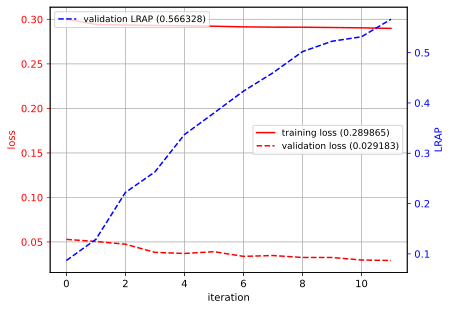

In [26]:
plot_history(cutmix_history)

In [27]:
test_solution, test_prediction = inference_model(cutmix_model, test_loader, channel_num=3, transform=transform)
test_solution = np.concatenate(test_solution, axis=0)
test_prediction = np.concatenate(test_prediction, axis=0)
cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
AP_score = LR_AP(test_solution, test_prediction)
print('test_cmAP: {:.6f}, test_LRAP: {:.6f}'.format(cmAP, AP_score))

0it [00:00, ?it/s]

test_cmAP: 0.638040, test_LRAP: 0.570414


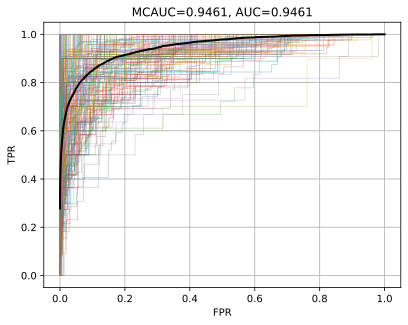

In [28]:
plot_ROC_AUC(test_solution, test_prediction)

## Results of the data augmentation
### To the Mixup:
+ To the metrics of cmAP and LRAP, it not better than the model without data augmentation
+ To the AUC score, it is nearly to the model without data augmentation
### To the CutMix:
+ To the metrics of cmAP and LRAP, it not better than the model without data augmentation
+ To the AUC score, it is nearly to the model without data augmentation
### Conclusion:
+ Although the data augmentation does not improve the model performance from the same model, but it expand the distribution of the training data, which may be helpful for the model to generalize the data.
+ After genralize the data, the model may have a more robust performance.
+ To get a robustness or accuracy model, we may need to trade off sometimes.

# 5 fold cross validation select the best model of it

In [22]:
def five_folds_cv(test_df:pd.DataFrame, train_df:pd.DataFrame):
    test_meldataset = BirdDataset(test_df, train_val=False)
    test_loader = torch.utils.data.DataLoader(test_meldataset, batch_size=Config.batch_size, shuffle=False)
    folds_history = []
    best_folds = -1
    best_LRAP = 0
    best_AUC = 0
    best_cmAP = 0
    best_model = None
    transform = trans_data()
    for fold in range(Config.n_fold):
        val_df = train_df[train_df['fold']==fold]
        train_df_ = train_df[train_df['fold']!=fold]
        train_meldataset = BirdDataset(train_df_)
        val_meldataset = BirdDataset(val_df)
        train_loader = torch.utils.data.DataLoader(train_meldataset, batch_size=Config.batch_size, shuffle=True)
        val_loader = torch.utils.data.DataLoader(val_meldataset, batch_size=Config.batch_size, shuffle=False)
        if fold!=0:
            print('====================================================================================================')
        print(f'fold {fold} train: {len(train_meldataset)} val: {len(val_meldataset)} test: {len(test_meldataset)}')


        model = MelClassifierBiLSTM(Config.n_class, 'efficientnet_b3', 512).to(Config.device)
        next(model.parameters()).device
        criterion = torch.nn.BCELoss()
        optimizer_dict  = {'optimizer': torch.optim.Adam(model.parameters(), lr=0.0005), 'scheduler': None}
        efficient_bilstm512_model, efficient_bilstm512_history, efficient_bilstm512_lr_list = trainer(model, criterion, transform, optimizer_dict, train_loader, val_loader,
                                                                                                        Config.epochs, channel_num=3, 
                                                                                                        save_path='efficient_bilstm512_model_fold{}.log'.format(fold))
        test_solution, test_prediction = inference_model(efficient_bilstm512_model, test_loader, channel_num=3, transform=transform)
        test_solution = np.concatenate(test_solution, axis=0)
        test_prediction = np.concatenate(test_prediction, axis=0)
        cmAP = padded_cmap_metrics(pd.DataFrame(test_solution), pd.DataFrame(test_prediction))
        AP_score = LR_AP(test_solution, test_prediction)
        auc_score = AUC(test_solution, test_prediction)
        print('test_cmAP: {:.6f}, test_LRAP: {:.6f}, test_AUC: {:.6f}'.format(cmAP, AP_score, auc_score))
        folds_history.append(efficient_bilstm512_history)
        if best_cmAP < cmAP:
            best_AUC = auc_score
            best_cmAP = cmAP
            best_LRAP = AP_score
            best_model = efficient_bilstm512_model
            best_folds = fold
    return folds_history, best_model, best_LRAP, best_AUC, best_cmAP, best_folds

In [24]:
five_folds_history, best_model, best_LRAP, best_AUC, best_cmAP, best_folds = five_folds_cv(test_df, train_df)

fold 0 train: 14212 val: 3554 test: 4442


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 13:40:18,179 - root - INFO - epoch: 1, train_loss: 0.300200, train_cmAP: 0.108267, train_LRAP: 0.008936
2023-04-21 13:40:18,179 - root - INFO - epoch: 1, val_loss: 0.042109, val_cmAP: 0.330819, val_LRAP: 0.094455
2023-04-21 13:42:53,048 - root - INFO - epoch: 2, train_loss: 0.293194, train_cmAP: 0.109770, train_LRAP: 0.018063
2023-04-21 13:42:53,048 - root - INFO - epoch: 2, val_loss: 0.040231, val_cmAP: 0.395621, val_LRAP: 0.244549
2023-04-21 13:45:25,599 - root - INFO - epoch: 3, train_loss: 0.290693, train_cmAP: 0.122638, train_LRAP: 0.066739
2023-04-21 13:45:25,600 - root - INFO - epoch: 3, val_loss: 0.033852, val_cmAP: 0.493104, val_LRAP: 0.352626
2023-04-21 13:48:00,599 - root - INFO - epoch: 4, train_loss: 0.289018, train_cmAP: 0.139433, train_LRAP: 0.100516
2023-04-21 13:48:00,599 - root - INFO - epoch: 4, val_loss: 0.027586, val_cmAP: 0.547047, val_LRAP: 0.418483
2023-04-21 13:50:36,435 - root - INFO - epoch: 5, train_loss: 0.288117, train_cmAP: 0.162783, train_LRAP

0it [00:00, ?it/s]

test_cmAP: 0.742816, test_LRAP: 0.680275, test_AUC: 0.960866
fold 1 train: 14213 val: 3553 test: 4442


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 14:13:53,027 - root - INFO - epoch: 1, train_loss: 0.300461, train_cmAP: 0.108407, train_LRAP: 0.008819
2023-04-21 14:13:53,028 - root - INFO - epoch: 1, val_loss: 0.052766, val_cmAP: 0.326997, val_LRAP: 0.116184
2023-04-21 14:16:19,370 - root - INFO - epoch: 2, train_loss: 0.293568, train_cmAP: 0.109056, train_LRAP: 0.011750
2023-04-21 14:16:19,370 - root - INFO - epoch: 2, val_loss: 0.042121, val_cmAP: 0.396381, val_LRAP: 0.224885
2023-04-21 14:18:47,144 - root - INFO - epoch: 3, train_loss: 0.291477, train_cmAP: 0.118345, train_LRAP: 0.050498
2023-04-21 14:18:47,144 - root - INFO - epoch: 3, val_loss: 0.034505, val_cmAP: 0.472354, val_LRAP: 0.321725
2023-04-21 14:21:29,956 - root - INFO - epoch: 4, train_loss: 0.289688, train_cmAP: 0.136085, train_LRAP: 0.087862
2023-04-21 14:21:29,957 - root - INFO - epoch: 4, val_loss: 0.035916, val_cmAP: 0.428172, val_LRAP: 0.411951
2023-04-21 14:24:39,545 - root - INFO - epoch: 5, train_loss: 0.288762, train_cmAP: 0.150170, train_LRAP

0it [00:00, ?it/s]

test_cmAP: 0.718305, test_LRAP: 0.652245, test_AUC: 0.956330
fold 2 train: 14213 val: 3553 test: 4442


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 14:47:32,159 - root - INFO - epoch: 1, train_loss: 0.300343, train_cmAP: 0.108418, train_LRAP: 0.008886
2023-04-21 14:47:32,160 - root - INFO - epoch: 1, val_loss: 0.049694, val_cmAP: 0.334550, val_LRAP: 0.117700
2023-04-21 14:50:05,784 - root - INFO - epoch: 2, train_loss: 0.292880, train_cmAP: 0.110355, train_LRAP: 0.021078
2023-04-21 14:50:05,784 - root - INFO - epoch: 2, val_loss: 0.042066, val_cmAP: 0.418107, val_LRAP: 0.259210
2023-04-21 14:52:35,307 - root - INFO - epoch: 3, train_loss: 0.290447, train_cmAP: 0.121066, train_LRAP: 0.067053
2023-04-21 14:52:35,308 - root - INFO - epoch: 3, val_loss: 0.034275, val_cmAP: 0.506990, val_LRAP: 0.368404
2023-04-21 14:55:07,508 - root - INFO - epoch: 4, train_loss: 0.289040, train_cmAP: 0.143535, train_LRAP: 0.107913
2023-04-21 14:55:07,508 - root - INFO - epoch: 4, val_loss: 0.025962, val_cmAP: 0.567226, val_LRAP: 0.432567
2023-04-21 14:57:36,858 - root - INFO - epoch: 5, train_loss: 0.287652, train_cmAP: 0.172482, train_LRAP

0it [00:00, ?it/s]

test_cmAP: 0.750331, test_LRAP: 0.687970, test_AUC: 0.962375
fold 3 train: 14213 val: 3553 test: 4442


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 15:20:17,090 - root - INFO - epoch: 1, train_loss: 0.300125, train_cmAP: 0.108575, train_LRAP: 0.008877
2023-04-21 15:20:17,091 - root - INFO - epoch: 1, val_loss: 0.048736, val_cmAP: 0.326710, val_LRAP: 0.092241
2023-04-21 15:22:48,063 - root - INFO - epoch: 2, train_loss: 0.293394, train_cmAP: 0.109606, train_LRAP: 0.015858
2023-04-21 15:22:48,063 - root - INFO - epoch: 2, val_loss: 0.042567, val_cmAP: 0.411773, val_LRAP: 0.257952
2023-04-21 15:25:20,119 - root - INFO - epoch: 3, train_loss: 0.290283, train_cmAP: 0.121458, train_LRAP: 0.059232
2023-04-21 15:25:20,120 - root - INFO - epoch: 3, val_loss: 0.034784, val_cmAP: 0.487827, val_LRAP: 0.356022
2023-04-21 15:27:47,254 - root - INFO - epoch: 4, train_loss: 0.289384, train_cmAP: 0.139741, train_LRAP: 0.099755
2023-04-21 15:27:47,255 - root - INFO - epoch: 4, val_loss: 0.030934, val_cmAP: 0.551612, val_LRAP: 0.415205
2023-04-21 15:30:21,612 - root - INFO - epoch: 5, train_loss: 0.287883, train_cmAP: 0.167546, train_LRAP

0it [00:00, ?it/s]

test_cmAP: 0.736758, test_LRAP: 0.680093, test_AUC: 0.961488
fold 4 train: 14213 val: 3553 test: 4442


  0%|          | 0/12 [00:00<?, ?it/s]

2023-04-21 15:53:08,481 - root - INFO - epoch: 1, train_loss: 0.300088, train_cmAP: 0.108312, train_LRAP: 0.008869
2023-04-21 15:53:08,481 - root - INFO - epoch: 1, val_loss: 0.048137, val_cmAP: 0.324501, val_LRAP: 0.092739
2023-04-21 15:55:43,751 - root - INFO - epoch: 2, train_loss: 0.293358, train_cmAP: 0.109088, train_LRAP: 0.013268
2023-04-21 15:55:43,751 - root - INFO - epoch: 2, val_loss: 0.041428, val_cmAP: 0.390135, val_LRAP: 0.230507
2023-04-21 15:58:22,867 - root - INFO - epoch: 3, train_loss: 0.291328, train_cmAP: 0.118591, train_LRAP: 0.049244
2023-04-21 15:58:22,868 - root - INFO - epoch: 3, val_loss: 0.035570, val_cmAP: 0.451930, val_LRAP: 0.303485
2023-04-21 16:00:55,809 - root - INFO - epoch: 4, train_loss: 0.289620, train_cmAP: 0.134659, train_LRAP: 0.085016
2023-04-21 16:00:55,811 - root - INFO - epoch: 4, val_loss: 0.031671, val_cmAP: 0.527608, val_LRAP: 0.407768
2023-04-21 16:03:29,496 - root - INFO - epoch: 5, train_loss: 0.288470, train_cmAP: 0.157836, train_LRAP

0it [00:00, ?it/s]

test_cmAP: 0.730670, test_LRAP: 0.666793, test_AUC: 0.961597


## Cross Validation with 5 folds
According to the above results, we get the best model from the 5 folds cross validation.

## Experiment Result

|  Model    | cmAP     |  LRAP    |  AUC    |  Augmentation  |
| :--: | :--: | :--: | :--: |:--:|
|   MLP   |   0.2748    |  0.0826    |  0.5064    |  - |
|  CNN    |   0.2741   |  0.0819    |   0.4873   |  -  |
|     MobileNetV2 | 0.3901     |   0.2767   |   0.8556   |  -  |
|   EfficientNetV3   |  0.5915    |  0.4904    |   0.9313   |   - |
| MovileNetV2 + BiLSTM     |  0.4650    |    0.3934   | 0.8870   |  - |
|  EfficientNetV3 + BiLSTM    |   0.7476   |    0.6890   |  0.9622   |- |
|  EfficientNetV3 + BiLSTM    |  0.6053    |   0.5431    |  0.9372   |Mixup |
|  EfficientNetV3 + BiLSTM    |  0.6380    |  0.5704  |  0.9461    |Cutmix|
|  5-flods EfficientNetV3 with cv    | 0.7503     |   0.6879   |  0.9623    |-|

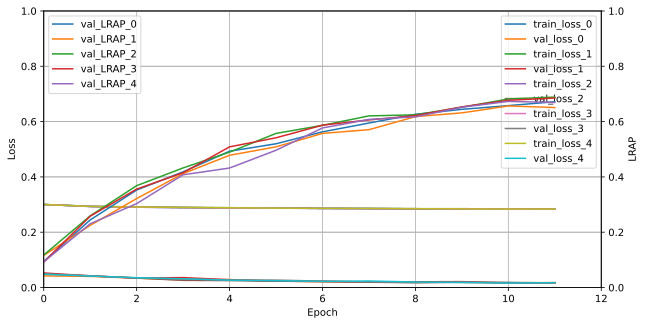

In [26]:
def plot_5history(history_list:list):
 # plot loss and LRAP in same x-axis
      fig, ax1 = plt.subplots(figsize=(10, 5))
      ax2 = ax1.twinx()
      ax1.set_xlabel('Epoch')
      ax1.set_ylabel('Loss')
      ax2.set_ylabel('LRAP')
      ax1.set_ylim(0, 1)
      ax2.set_ylim(0, 1)
      ax1.set_xlim(0, Config.epochs)
      ax1.grid(True)
      ax2.grid(True)
      for i, history in enumerate(history_list):
            ax1.plot(history['train_loss'], label='train_loss_{}'.format(i))
            ax1.plot(history['val_loss'], label='val_loss_{}'.format(i))
            ax2.plot(history['val_LRAP'], label='val_LRAP_{}'.format(i))
      ax1.legend(loc='upper right')
      ax2.legend(loc='upper left')
      plt.show()


plot_5history(five_folds_history)   

In [25]:
torch.save(best_model, './best_model.pth')

# Part 4: Conclusion

In conclusion, in this project, we do the following things:
+ Do the statistical and visualized analysis on the audio data and metadata before the training for a better understanding of the data.
  
+ Do the data preprocessing to get the data with MEL-spectrogram, MFCCS, which refer the concept of :
  + the dimensionality reduction, 
  + bag of words, 
  + data unbalance, 
  + data upsample,
  + and multi-label classification.
  
+ Do the classical machine learning model training with cross validation as baseline model with MFCCS feature, which include:
  + logistic regression
  + poly SVM
  + rbf SVM
  + lightGBM
  + Random Forest
  The Random Forest model is the best model in the classical machine learning model.

+ Do the deep learning model training with mel-spectrogram feature, and also using data augmentation and cross validation which include:
  + MLP
  + CNN
  + MobileNetV2 (CNN)
  + EfficientNetV3 (CNN)
  + MobileNetV2 (CNN) + Bi-LSTM (RNN)
  + EfficientNetV3 (CNN) + Bi-LSTM (RNN)
  + Data Augmentation: Mixup and Cutmix
  + Cross Validation: 5 folds
  The EfficientNetV3 (CNN) + Bi-LSTM (RNN) model is the best model in the deep learning model, and the model with data augmentation get a good performance with higher robustness.

# Part 5: Apply advanced Model for exploration:
## Incorporateng attention-based audio spectrogram transformer

Inspired by Audio Spectrogram Transformer (AST) model, we use attention-based mechanisms to process audio spectrograms. AST can capture long-range global context in the lowest layers.
Also AST can leverage pretrained Vision Transformer (ViT) on the ImageNet dataset. This approach allows AST to benefit from the rich visual representations learned by ViT and leverage them for audio analysis.


In [ ]:
!pip install timm==0.4.5
!pip install albumentations
!pip install torchmetrics
!pip install colorednoise

In [ ]:
from torchmetrics import Precision, Recall
import colorednoise as cn
from torch import nn
from torch.optim import lr_scheduler
import os
from sklearn.metrics import precision_recall_fscore_support
import pandas as pd
import warnings
import numpy as np
from contextlib import nullcontext
from torch.optim import AdamW, Adam, SGD
import gc
from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
# from config import config, cnn_conf
import torch
import torchaudio
import timm
from timm.models.layers import to_2tuple, trunc_normal_
import argparse
from torch.utils.data import Dataset, DataLoader
from albumentations.augmentations import CoarseDropout
import pathlib
import random
from sklearn.model_selection import StratifiedGroupKFold
from tensorboardX import SummaryWriter

In [ ]:
# TRAIN SETTINGS
config = {
    "epochs": 30,
    "n_classes": 264,
    "n_folds": 3,
    "num_classes": 264,
    "train_batch_size": 2,
    "learning_rate": 1e-3,
    "device": 'cuda',
    "scheduler": 'OneCycle',
    "weight_decay": 1e-7,
    # Training with Audio Spectrogram Transformer
    "ast": True,  
    # DATA SETTINGS
    "use_secondary": False,  # use secondary labels => multi-label training
    "use_slices": False,  # use slicing => trains on whole recordings
    "mixup": False
}

signal_conf = {
    "sr": 32_000,
    "fmin": 16,
    "fmax": 16386,
    "nmels": 128,
    "nfft": 1024,
    "len_segment": 30,
    "hop_length": 512
}

class DotDict(dict):
    """dot.notation access to dictionary attributes"""
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

cfg = DotDict(config)

In [ ]:
# prepare dataset
parser = argparse.ArgumentParser(description="AST training pipeline")
args = parser.parse_args(args=[])
args.data_path = "./input/BirdCLEF-2023/"
args.pretrain = False
args.load_weights = False

# enable benchmark mode for more power
torch.backends.cudnn.benchmark = True

args.use_secondary = config['use_secondary']
args.mixup = config["mixup"]
args.data_folder = os.path.join(args.data_path, 'data')
print("args = ", args)

log_dir = "./tb_logs/"
os.makedirs(log_dir, exist_ok=True)
writer = SummaryWriter(log_dir=log_dir)

Then we prepare the Bird Clef Mel Dataset.

In [ ]:
def normalize_0_1(tensor):
    tensor = tensor - tensor.min()
    if tensor.max() != 0:
        tensor /= tensor.max()
    return tensor

def str_array_to_array(str_arr):
    array = []
    for row in str_arr:
        r = row.replace(']', '').replace('[', '')
        r = [int(x) for x in r.split()]
        array.append(r)
    return np.array(array)

# dataset
class BirdClefMelDataset(Dataset):
    def __init__(self,
                 train: bool,
                 args,
                 df,
                 noise_p=0.5,
                 use_secondary=False
                 ):
        self.train = train
        self.df = df
        self.aug = CoarseDropout(
            max_holes=5, max_height=8, max_width=30, p=0.5)
        self.noise_p = noise_p
        self.secondary = use_secondary
        self.df_paths = df['path']
        self.pri_enc = df['pri_enc']
        self.pri_dec = df['primary_label']
        self.scores = df['score']
        self.sec_enc = str_array_to_array(df.loc[:, 'sec_enc'])
        self.sr = signal_conf['sr']
        self.hl = signal_conf['hop_length']
        self.dur = signal_conf['len_segment']
        self.dur_samps = int(self.dur * self.sr / self.hl + 1)
        self.dur_window = (3 * self.dur_samps) // 4  # 25% overlap
        self.noise_files = [
            f'{args.data_path}/noise/{f}' for f in os.listdir(f'{args.data_path}/noise')]
        self.slicing = config['use_slices']
        self.mapping = pd.read_csv(
            f"{args.data_path}/mapping.csv").iloc[:, 1].to_list()

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        # extract the item chosen
        fpath = pathlib.Path(pathlib.PurePosixPath(
            self.df_paths[index])).resolve()
        specs = np.load(fpath, allow_pickle=True)
        mel = specs.f.mel
        # mel = specs
        mel = normalize_0_1(mel)

        # pad with zeros if the audio is not of the length 'dur_samps + k * dur_window, k>=0'
        if mel.shape[1] < self.dur_samps:
            to_pad = self.dur_samps - mel.shape[1]  # pad to len = dur_samps
            pad = np.zeros((mel.shape[0], to_pad))
            mel = np.column_stack((mel, pad))
        elif (mel.shape[1] - self.dur_samps) % self.dur_window != 0 and self.slicing:
            residual_time = (mel.shape[1] - self.dur_samps) % self.dur_window
            # pad to len = dur_samps + k * dur_window
            to_pad = self.dur_window - residual_time
            pad = np.zeros((mel.shape[0], to_pad))
            mel = np.column_stack((mel, pad))

        if self.slicing:
            # take 'dur_samps' chunks with 'dur_window' window
            num_chunks = (mel.shape[1] - self.dur_samps) // self.dur_window + 1
            mels = []
            for chunk in range(num_chunks):
                start = chunk * self.dur_window
                mel_chunk = mel[:, start:start + self.dur_samps]
                mels.append(mel_chunk)
            # convert to torch tensor
            mel_normal = np.array(mels)
        else:
            # pick random seconds chunk
            if mel.shape[1] == self.dur_samps:
                start = 0
            else:
                start = np.random.randint(0, mel.shape[1] - self.dur_samps)
            mel_normal = mel[:, start:start + self.dur_samps]

        # do noise injection with probablitiy noise_p
        if self.train and np.random.random() < self.noise_p and self.noise_files != []:
            noise_path = random.choice(self.noise_files)
            spec_noise = np.load(noise_path, allow_pickle=True)
            spec_noise = spec_noise.f.mel
            mel_noise = normalize_0_1(spec_noise)
            mel_noise *= np.random.random() * 0.5

            # add noise to the splits
            noise_start = 0
            if not mel_noise.shape[1] == self.dur_samps:
                noise_start = np.random.randint(
                    0, mel_noise.shape[1] - self.dur_samps)
            if self.slicing:
                for split in range(mel_normal.shape[0]):
                    mel_normal[split, :, :] += mel_noise[:,
                                                         noise_start:noise_start + self.dur_samps]
            else:
                mel_normal += mel_noise[:,
                                        noise_start:noise_start + self.dur_samps]

            mel_normal = normalize_0_1(mel_normal)

        # coarse dropout
        mel_normal = self.aug(image=mel_normal)['image']

        # load the labels
        if self.secondary:
            label = torch.tensor(self.sec_enc[index]).type(torch.FloatTensor)
        else:
            label = torch.tensor(self.mapping.index(
                self.pri_dec[index])).type(torch.LongTensor)

        data = {
            'mels': torch.FloatTensor(mel_normal),
            'path': str(fpath),
            'score': float(self.scores[index])
        }
        return data, label


def get_data(df, fold, args, type="mel", sec=False):
    # extract fold
    train_df = df[df['fold'] != fold].reset_index(drop=True)
    valid_df = df[df['fold'] == fold].reset_index(drop=True)

    train_dataset = BirdClefMelDataset(
        train=True, args=args, df=train_df, use_secondary=sec)
    valid_dataset = BirdClefMelDataset(
        train=False, args=args, df=valid_df, use_secondary=sec)

    # auto fix batch size of slicing
    bs = 1 if config['use_slices'] else config['train_batch_size']
    # generate train loaders
    train_loader = DataLoader(train_dataset,
                              batch_size=bs,
                              num_workers=8,
                              prefetch_factor=2,
                              pin_memory=True,
                              shuffle=True)

    valid_loader = DataLoader(valid_dataset,
                              batch_size=bs,
                              num_workers=8,
                              prefetch_factor=2,
                              pin_memory=True,
                              shuffle=False)

    return train_loader, valid_loader


def get_dataset(args):
    path = args.data_path
    secondary = args.use_secondary

    print(f"Read config {config}")
    df = pd.read_csv(f'{path}/augmented.csv')
    if args.mixup:
        print("=" * 10)
        print("MIXUP ACTIVATED")
        print("=" * 10)

    # make folds, stratify with primary labels anyways, even when we have secondary label usage
    skf = StratifiedGroupKFold(
        n_splits=config['n_folds'], shuffle=True, random_state=42)
    for k, (_, val_ind) in enumerate(skf.split(X=df, y=df['primary_label'], groups=df['file'])):
        df.loc[val_ind, 'fold'] = k

    # generate n_fold datasets
    folded_ds = []
    for fold in range(config['n_folds']):
        train_ds, valid_ds = get_data(df, fold, args, sec=secondary)
        folded_ds.append((train_ds, valid_ds))

    return folded_ds

# get dataset
dataset = get_dataset(args)

Next, we define the Audio Spectrogram Transformer model.

The architecture of Audio Spectrogram Transformer is illustrated in the figure below:
<!-- ![ast_model_arch](./ast_model_arch.png) -->
 <img src="./asset/ast_model_arch.png" width = "400" height = "300" alt="ast_model_arch" align=center />

First, the input audio waveform of duration t is converted into a sequence of 128-dimensional log Mel filterbank features. This spectrogram is then split into a sequence of N patches with an overlap in both time and frequency dimensions. Each patch is flattened into a 1D patch embedding of size 768 using a linear projection layer, referred to as the patch embedding layer. Since the Transformer architecture does not capture the input order information and the patch sequence is not in temporal order, we add a trainable positional embedding to each patch embedding of size 768. The addition of this positional embedding allows the model to capture the spatial structure of the 2D audio spectrogram.

In [ ]:
# Training with Audio Spectrogram Transformer model

class PatchEmbed(nn.Module):
    def __init__(self, img_size=224, patch_size=16, in_chans=3, embed_dim=768):
        """
        This function initializes the patch embeddings with the following parameters:
        - img_size: The size of the image.
        - patch_size: The size of the patch.
        - in_chans: The number of channels in the image.
        - embed_dim: The size of the embedding
        """
        super().__init__()

        img_size = to_2tuple(img_size)
        patch_size = to_2tuple(patch_size)
        num_patches = (img_size[1] // patch_size[1]) * \
            (img_size[0] // patch_size[0])
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = num_patches

        self.proj = nn.Conv2d(in_chans, embed_dim,
                              kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x).flatten(2).transpose(1, 2)
        return x


class ASTModel(nn.Module):
    """
    The AST model.
    :param label_dim: the label dimension
    :param fstride: the stride of patch spliting on the frequency dimension, for 16*16 patchs, fstride=16 means no
    overlap, fstride=10 means overlap of 6
    :param tstride: the stride of patch spliting on the time dimension, for 16*16 patchs, tstride=16 means no
    overlap, tstride=10 means overlap of 6
    :param input_fdim: the number of frequency bins of the input spectrogram
    :param input_tdim: the number of time frames of the input spectrogram
    :param imagenet_pretrain: if use ImageNet pretrained model
    :param audioset_pretrain: if use full AudioSet and ImageNet pretrained model
    :param model_size: the model size of AST, should be in [tiny224, small224, base224, base384], base224 and base
    384 are same model, but are trained differently during ImageNet pretraining.
    """

    def __init__(self, label_dim=264, fstride=16, tstride=16, input_fdim=128, input_tdim=1876, imagenet_pretrain=True,
                 audioset_pretrain=False, model_size='small224', verbose=True):

        super(ASTModel, self).__init__()
        # assert timm.__version__ == '0.4.5'

        # override timm input shape restriction
        timm.models.vision_transformer.PatchEmbed = PatchEmbed

        if model_size == 'tiny224':
            self.v = timm.create_model(
                'vit_deit_tiny_distilled_patch16_224', pretrained=imagenet_pretrain)
        elif model_size == 'small224':
            self.v = timm.create_model(
                'vit_deit_small_distilled_patch16_224', pretrained=imagenet_pretrain)
        elif model_size == 'base224':
            self.v = timm.create_model(
                'vit_deit_base_distilled_patch16_224', pretrained=imagenet_pretrain)
        elif model_size == 'base384':
            self.v = timm.create_model(
                'vit_deit_base_distilled_patch16_384', pretrained=imagenet_pretrain)
        else:
            raise Exception(
                'Model size must be one of tiny224, small224, base224, base384.')

        self.original_num_patches = self.v.patch_embed.num_patches
        self.oringal_hw = int(self.original_num_patches ** 0.5)
        self.original_embedding_dim = self.v.pos_embed.shape[2]
        self.mlp_head = nn.Sequential(nn.LayerNorm(self.original_embedding_dim),
                                      nn.Linear(self.original_embedding_dim, label_dim))

        # automatcially get the intermediate shape
        f_dim, t_dim = self.get_shape(fstride, tstride, input_fdim, input_tdim)
        num_patches = f_dim * t_dim
        self.v.patch_embed.num_patches = num_patches
        if verbose == True:
            print('frequncey stride={:d}, time stride={:d}'.format(
                fstride, tstride))
            print('number of patches={:d}'.format(num_patches))

        # the linear projection layer
        new_proj = torch.nn.Conv2d(1, self.original_embedding_dim, kernel_size=(
            16, 16), stride=(fstride, tstride))
        if imagenet_pretrain == True:
            new_proj.weight = torch.nn.Parameter(
                torch.sum(self.v.patch_embed.proj.weight, dim=1).unsqueeze(1))
            new_proj.bias = self.v.patch_embed.proj.bias
        self.v.patch_embed.proj = new_proj

        # the positional embedding
        if imagenet_pretrain == True:
            # get the positional embedding from deit model, skip the first two tokens (cls token and distillation
            # token), reshape it to original 2D shape (24*24).
            new_pos_embed = self.v.pos_embed[:, 2:, :].detach().reshape(1, self.original_num_patches,
                                                                        self.original_embedding_dim).transpose(1,
                                                                                                               2).reshape(
                1, self.original_embedding_dim, self.oringal_hw, self.oringal_hw)
            # cut (from middle) or interpolate the second dimension of the positional embedding
            if t_dim <= self.oringal_hw:
                new_pos_embed = new_pos_embed[:, :, :,
                                              int(self.oringal_hw / 2) - int(t_dim / 2): int(self.oringal_hw / 2) - int(
                                                  t_dim / 2) + t_dim]
            else:
                new_pos_embed = torch.nn.functional.interpolate(new_pos_embed, size=(self.oringal_hw, t_dim),
                                                                mode='bilinear')
            # cut (from middle) or interpolate the first dimension of the positional embedding
            if f_dim <= self.oringal_hw:
                new_pos_embed = new_pos_embed[:, :,
                                              int(self.oringal_hw / 2) - int(f_dim / 2): int(self.oringal_hw / 2) - int(
                                                  f_dim / 2) + f_dim, :]
            else:
                new_pos_embed = torch.nn.functional.interpolate(
                    new_pos_embed, size=(f_dim, t_dim), mode='bilinear')
            # flatten the positional embedding
            new_pos_embed = new_pos_embed.reshape(
                1, self.original_embedding_dim, num_patches).transpose(1, 2)
            # concatenate the above positional embedding with the cls token and distillation token of the deit model.
            self.v.pos_embed = nn.Parameter(
                torch.cat([self.v.pos_embed[:, :2, :].detach(), new_pos_embed], dim=1))
        else:
            # if not use imagenet pretrained model, just randomly initialize a learnable positional embedding
            new_pos_embed = nn.Parameter(
                torch.zeros(1, self.v.patch_embed.num_patches + 2, self.original_embedding_dim))
            self.v.pos_embed = new_pos_embed
            trunc_normal_(self.v.pos_embed, std=.02)

    def get_shape(self, fstride, tstride, input_fdim=128, input_tdim=1024):
        test_input = torch.randn(1, 1, input_fdim, input_tdim)
        test_proj = nn.Conv2d(1, self.original_embedding_dim, kernel_size=(
            16, 16), stride=(fstride, tstride))
        test_out = test_proj(test_input)
        f_dim = test_out.shape[2]
        t_dim = test_out.shape[3]
        return f_dim, t_dim

    def forward(self, x):
        """
        :param x: the input spectrogram, expected shape: (batch_size, time_frame_num, frequency_bins), e.g., (12, 1024, 128)
        :return: prediction
        """
        x = x.unsqueeze(1)
        x = x.transpose(2, 3)

        B = x.shape[0]
        x = self.v.patch_embed(x)
        cls_tokens = self.v.cls_token.expand(B, -1, -1)
        dist_token = self.v.dist_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, dist_token, x), dim=1)
        x = x + self.v.pos_embed
        x = self.v.pos_drop(x)
        for blk in self.v.blocks:
            x = blk(x)
        x = self.v.norm(x)
        x = (x[:, 0] + x[:, 1]) / 2

        x = self.mlp_head(x)
        return x

Then, we create functions for training and evaluation.

In [ ]:
@torch.no_grad()
def varying_threshold_metrics(preds, targets, targets_thresh=0.2):
    thresholds = np.linspace(0, 0.5, 20)
    metrics = []
    targets = torch.tensor(targets >= targets_thresh, dtype=torch.long)
    for thresh in thresholds:
        precision = Precision(num_labels=152, threshold=thresh, average='micro', task='multilabel',
                              multidim_average='global').to(device=config['device'])
        recall = Recall(num_labels=152, threshold=thresh, average='micro', task='multilabel',
                        multidim_average='global').to(device=config['device'])
        p = precision(preds, targets).item()
        r = recall(preds, targets).item()
        f1 = 2 * p * r / (p + r) if not p * r == 0 else 0
        metrics.append([p, r, f1])
    results = np.column_stack((thresholds, metrics))
    return results


def fetch_scheduler(optimizer, sched: str, spe: int = None, epochs: int = None):
    """
    :param optimizer: the optimizer to use
    :param config: the config file
    :return: It returns a scheduler object based on the string passed in the config file.
    """
    if sched == 'CosineAnnealingLR':
        scheduler = lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=10, eta_min=1e-4)
    elif sched == 'CosineAnnealingWarmRestarts':
        scheduler = lr_scheduler.CosineAnnealingWarmRestarts(
            optimizer, T_0=5, T_mult=2, eta_min=1e-5)
    elif sched == 'OneCycle':
        scheduler = lr_scheduler.OneCycleLR(optimizer, max_lr=config['learning_rate'], steps_per_epoch=spe,
                                            epochs=epochs)
    elif sched is None:
        return None

    return scheduler

In [ ]:
def do_epoch(train, model, data_loader, optimizer, scheduler, scaler, conf, epoch):
    """
    Does one epoch of either training or evaluation.
    :param train: boolean, whether to train or test
    :param model: the model to train
    :param data_loader: a DataLoader object that iterates over the training data
    :param optimizer: the optimizer used to train the model
    :param scheduler: the learning rate scheduler
    :param scaler: a scaler object that will scale the gradients
    :param conf: a dictionary containing the configuration of the model
    :param epoch: the current epoch number
    """
    device = conf.device
    loss_bce = torch.nn.BCEWithLogitsLoss()
    loss_ce = torch.nn.CrossEntropyLoss(label_smoothing=1e-3, reduction='none')

    if train:
        model.train()
        prefix = "Train"
        context = nullcontext()
    else:
        model.eval()
        prefix = "Valid"
        context = torch.no_grad()

    predictions = torch.tensor([], device=device)
    targets = torch.tensor([], device=device)
    running_loss = 0
    iters = len(data_loader)
    loop = tqdm(data_loader, position=0)

    with context:
        for i, (data, labels) in enumerate(loop):
            if train:
                model.zero_grad()
            mels = data['mels'].to(
                device=device, non_blocking=True, dtype=torch.float)

            # extract the labels in case of mixup
            if conf.mixup:
                label1 = labels[0].to(device=device, non_blocking=True)
                label2 = labels[1].to(device=device, non_blocking=True)
                r = data['rval'].to(device=device, non_blocking=True)
            else:
                labels = labels.to(device=device, non_blocking=True)

            score = data['score'].to(device=device)

            with torch.cuda.amp.autocast():
                if conf.use_slices:
                    # swap so we have B 1 H W
                    mels = torch.swapaxes(mels, 0, 1)
                    # create slices
                    slices = mels.split(8)
                    # concatenate the slices in the output vector
                    outputs = torch.tensor([], device=device)

                    for i, s in enumerate(slices):
                        if conf.ast:
                            # squeeze out the channel dimension for ast model
                            s = s.squeeze(1)
                        s = s.to(device=device, non_blocking=True)
                        pred = model(s)
                        outputs = torch.cat((outputs, pred), dim=0)

                    # combine the outputs together
                    outputs = torch.mean(outputs, dim=0, keepdim=True)
                    del slices
                else:
                    if not conf.ast:
                        mels = torch.unsqueeze(mels, 1)
                    outputs = model(mels)

                # scale to logspace for KL
                if conf.use_secondary:
                    # do bce loss plus focal loss
                    loss = loss_bce(outputs, labels)
                elif conf.mixup:
                    loss = r * loss_ce(outputs, label1) + \
                        (1 - r) * loss_ce(outputs, label2)
                    loss = torch.mean(loss, dim=0)
                else:
                    loss_scaled = loss_ce(outputs, labels) * score / 5
                    loss = torch.mean(loss_scaled, dim=0)

            if(i % 100 == 0):
                print("loss = ", loss)

            # calculate sigmoid for multilabel
            if conf.use_secondary:
                preds = torch.sigmoid(outputs)
            else:
                _, preds = torch.max(outputs, -1)

            # do optimizer and scheduler steps
            if train:
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
                if scheduler is not None:
                    scheduler.step(epoch + i / iters)
                del outputs, mels

            running_loss += loss.item()

            # append for metrics in validation
            predictions = torch.cat((predictions, preds.detach()), dim=0)
            if conf.mixup:
                labels = torch.where(r > (1 - r), label1, label2)
                targets = torch.cat((targets, labels.detach()), dim=0)
            else:
                targets = torch.cat((targets, labels.detach()), dim=0)
            loop.set_description(f"{prefix} Epoch [{epoch + 1}/{conf.epochs}")
            loop.set_postfix(loss=loss.item())

    # calculate metrics for varying thresholds
    if not conf.use_secondary:
        p, r, f1, _ = precision_recall_fscore_support(
            y_pred=predictions.cpu().view(-1).numpy(),
            y_true=targets.cpu().view(-1).numpy(),
            zero_division=0,
            average='micro'
        )
    else:
        metrics = varying_threshold_metrics(predictions, targets)
        results = pd.DataFrame(data=metrics, columns=[
                               "threshold", "precision", "recall", "f1 score"])
        f1 = results['f1 score'].max()
        precision = results['precision'].max()
        recall = results['recall'].max()

    # log to tensorboard
    running_loss /= len(data_loader)

    writer.add_scalar('Train/running_loss', running_loss, epoch)
    writer.add_scalar('Train/precision', precision, epoch)
    writer.add_scalar('Train/recall', recall, epoch)
    writer.add_scalar('Train/f1', f1, epoch)
    
    return results, running_loss


In [ ]:
def run(data, fold, args):
    train_loader, valid_loader = data
    cfg = DotDict(config)
    cfg.pretrain = args.pretrain

    model_name = 'ast'
    model = ASTModel().to(cfg.device)

    optimizer = AdamW(model.parameters(), lr=cfg.learning_rate,
                      weight_decay=cfg.weight_decay)
    scheduler = fetch_scheduler(
        optimizer, "OneCycle", spe=len(train_loader), epochs=cfg.epochs)
    scaler = torch.cuda.amp.GradScaler()

    best_valid_f1 = 0
    best_valid_loss = np.inf

    prefix = './pretrain/' if cfg.pretrain else './'

    for epoch in range(cfg.epochs):
        do_epoch(True, model, train_loader, optimizer, scheduler,
                 scaler, cfg, epoch + fold * cfg.epochs)
        val_res, val_loss = do_epoch(
            False, model, valid_loader, optimizer, scheduler, scaler, cfg, epoch + fold * cfg.epochs)
        val_f1 = val_res['f1 score']
        val_precision = val_res['precision']
        val_recall = val_res['recall']
        
        writer.add_scalar('Val/val_loss', val_loss, epoch)
        writer.add_scalar('Val/val_f1', val_f1, epoch)
        writer.add_scalar('Val/val_precision', val_precision, epoch)
        writer.add_scalar('Val/val_recall', val_recall, epoch)

        if val_loss < best_valid_loss:
            print(
                f"Validation Loss Improved - {best_valid_loss} --> {val_loss}")
            best_valid_loss = val_loss
            torch.save(model.state_dict(), f'{prefix}model_{fold}_{model_name}.bin')
            print(f"Saved model checkpoint at {prefix}model_{fold}_{model_name}.bin")

        if val_f1 > best_valid_f1:
            print(f"Validation F1 Improved - {best_valid_f1} --> {val_f1}")
            best_valid_f1 = val_f1

    return best_valid_loss, best_valid_f1

In [ ]:
# train n_folds models
for fold in range(config['n_folds']):
    torch.cuda.empty_cache()
    print("=" * 30)
    print("Training Fold - ", fold)
    print("=" * 30)
    best_param = run(dataset[fold], fold, args)
    gc.collect()
    torch.cuda.empty_cache()

The training process is executed via Python bash. The resulting training loss and training mAP are displayed below:

<img src="./asset/Train_loss.png" width = "400" height = "300" alt="Train_loss" align=center />


<img src="./asset/Train_map.png" width = "400" height = "300" alt="Train_map" align=center />

The validation loss and validation mAP are displayed below:

<img src="./asset/Val_loss.png" width = "400" height = "300" alt="Train_loss" align=center />


<img src="./asset/Val_map.png" width = "400" height = "300" alt="Train_map" align=center />

We find that the Audio Spectrogram Transformer architecture is prone to overfitting, which may lead to suboptimal performance on new data.

# Acknowledgements
In this project, we use the following open source code, libraries, and datasets:
+ [BirdCLEF 2023](https://www.kaggle.com/c/birdclef-2023)
+ [pytorch](https://pytorch.org/)
+ [librosa](https://librosa.org/doc/latest/index.html)
+ [torhtools](https://github.com/PistonY/torch-toolbox)